In [24]:
import pandas as pd
import numpy as np

In [25]:
data=pd.read_csv("../data/insurance.csv")

In [26]:
type(data)

pandas.core.frame.DataFrame

In [27]:
data.isnull().sum()

age         0
sex         0
bmi         0
children    0
smoker      0
region      0
expenses    0
dtype: int64

In [28]:
data

,age,sex,bmi,children,smoker,region,expenses
0,19,female,27.9,0,yes,southwest,16884.92
1,18,male,33.8,1,no,southeast,1725.55
2,28,male,33.0,3,no,southeast,4449.46
3,33,male,22.7,0,no,northwest,21984.47
4,32,male,28.9,0,no,northwest,3866.86
...,...,...,...,...,...,...,...
1333,50,male,31.0,3,no,northwest,10600.55
1334,18,female,31.9,0,no,northeast,2205.98
1335,18,female,36.9,0,no,southeast,1629.83
1336,21,female,25.8,0,no,southwest,2007.95


In [29]:
data.shape[0]

1338

In [30]:
data.to_csv('data2_csv',index=False,sep=',')

In [31]:
d=pd.read_csv('data2_csv')
d

,age,sex,bmi,children,smoker,region,expenses
0,19,female,27.9,0,yes,southwest,16884.92
1,18,male,33.8,1,no,southeast,1725.55
2,28,male,33.0,3,no,southeast,4449.46
3,33,male,22.7,0,no,northwest,21984.47
4,32,male,28.9,0,no,northwest,3866.86
...,...,...,...,...,...,...,...
1333,50,male,31.0,3,no,northwest,10600.55
1334,18,female,31.9,0,no,northeast,2205.98
1335,18,female,36.9,0,no,southeast,1629.83
1336,21,female,25.8,0,no,southwest,2007.95


In [32]:
# checking for missing values
data.isna().sum()

age         0
sex         0
bmi         0
children    0
smoker      0
region      0
expenses    0
dtype: int64

In [33]:
# checking for th number of categorical and numerical columns
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1338 entries, 0 to 1337
Data columns (total 7 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   age       1338 non-null   int64  
 1   sex       1338 non-null   object 
 2   bmi       1338 non-null   float64
 3   children  1338 non-null   int64  
 4   smoker    1338 non-null   object 
 5   region    1338 non-null   object 
 6   expenses  1338 non-null   float64
dtypes: float64(2), int64(2), object(3)
memory usage: 73.3+ KB


In [34]:
data['region'].value_counts()

southeast    364
southwest    325
northwest    325
northeast    324
Name: region, dtype: int64

In [35]:
# Looking at the descriptive statistics of the data
data.describe(include='all')

,age,sex,bmi,children,smoker,region,expenses
count,1338.000000,1338,1338.000000,1338.000000,1338,1338,1338.000000
unique,NaN,2,NaN,NaN,2,4,NaN
top,NaN,male,NaN,NaN,no,southeast,NaN
freq,NaN,676,NaN,NaN,1064,364,NaN
mean,39.207025,NaN,30.665471,1.094918,NaN,NaN,13270.422414
std,14.049960,NaN,6.098382,1.205493,NaN,NaN,12110.011240
min,18.000000,NaN,16.000000,0.000000,NaN,NaN,1121.870000
25%,27.000000,NaN,26.300000,0.000000,NaN,NaN,4740.287500
50%,39.000000,NaN,30.400000,1.000000,NaN,NaN,9382.030000
75%,51.000000,NaN,34.700000,2.000000,NaN,NaN,16639.915000


In [36]:
# Finging unique values for each column
# TO understand which column is categorical and which one is Continuous
# Typically if the numer of unique values are < 20 then the variable is likely to be a category otherwise continuous
data.nunique()

age           47
sex            2
bmi          275
children       6
smoker         2
region         4
expenses    1337
dtype: int64

## Visualization

In [37]:
# Plotting multiple bar charts at once for categorical variables
# Since there is no default function which can plot bar charts for multiple columns at once
# we are defining our own function for the same

def PlotBarCharts(inpData, colsToPlot):
    %matplotlib inline
    
    import matplotlib.pyplot as plt
    
    # Generating multiple subplots
    fig, subPlot=plt.subplots(nrows=1, ncols=len(colsToPlot), figsize=(20,5))
    fig.suptitle('Bar charts of: '+ str(colsToPlot))

    for colName, plotNumber in zip(colsToPlot, range(len(colsToPlot))):
        inpData.groupby(colName).size().plot(kind='bar',ax=subPlot[plotNumber])

In [38]:
cat_col=data.select_dtypes(include=['object']).copy()
cat_col['children']=data['children']


In [39]:
cat_col

,sex,smoker,region,children
0,female,yes,southwest,0
1,male,no,southeast,1
2,male,no,southeast,3
3,male,no,northwest,0
4,male,no,northwest,0
...,...,...,...,...
1333,male,no,northwest,3
1334,female,no,northeast,0
1335,female,no,southeast,0
1336,female,no,southwest,0


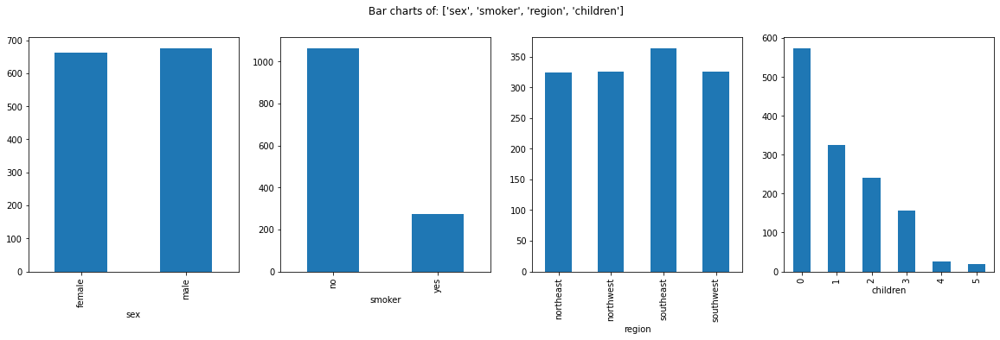

In [40]:
 PlotBarCharts(inpData=cat_col, colsToPlot=['sex','smoker','region','children'])

# Bar PLot Iterpretation

## If there is a column which shows too skewed distribution where there is only one dominant bar and the other categories are present in very low numbers. These kind of columns may not be very helpful in machine learning. We confirm this in the correlation analysis section and take a final call to select or reject the column.

In [41]:
num_col=data.select_dtypes(include=['int64','float64']).copy()
num_col=num_col.drop('children',axis=1)
num_col

,age,bmi,expenses
0,19,27.9,16884.92
1,18,33.8,1725.55
2,28,33.0,4449.46
3,33,22.7,21984.47
4,32,28.9,3866.86
...,...,...,...
1333,50,31.0,10600.55
1334,18,31.9,2205.98
1335,18,36.9,1629.83
1336,21,25.8,2007.95


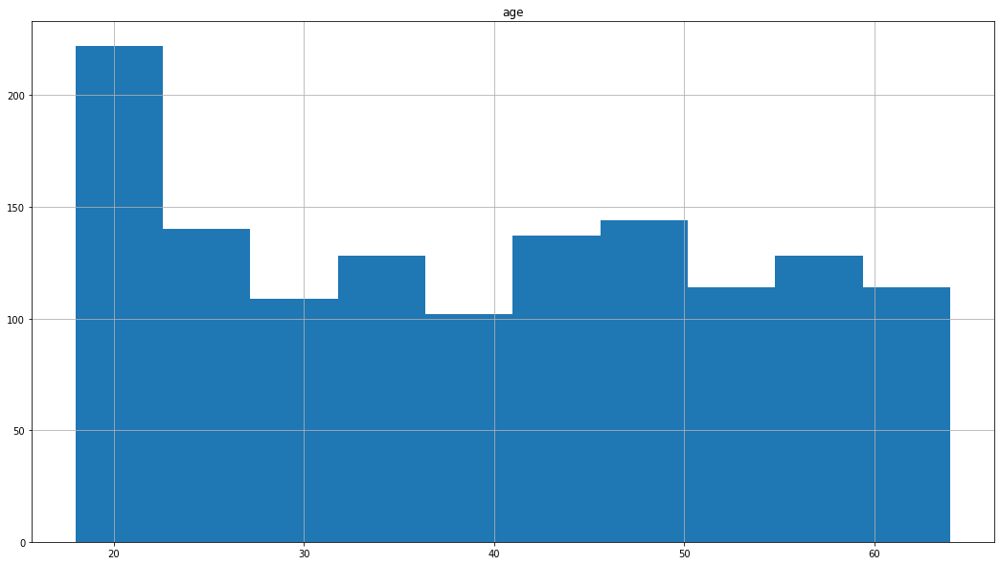

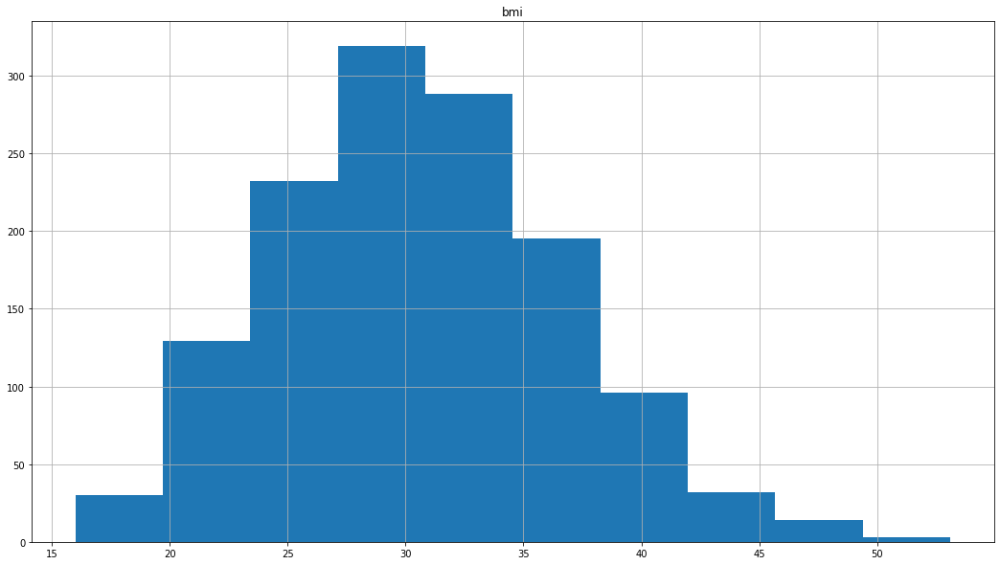

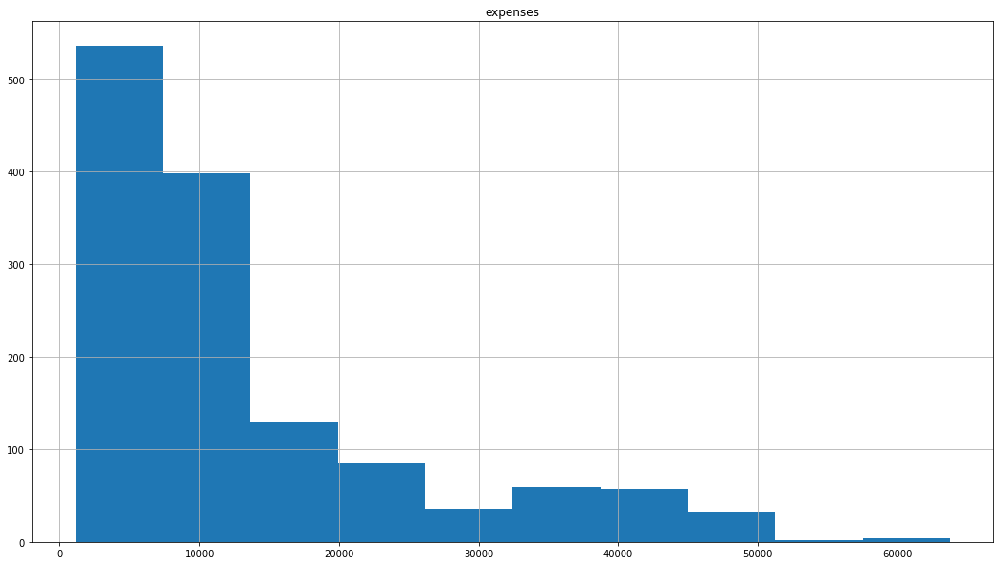

In [42]:
# Plotting histograms of multiple columns together
for col in num_col:
    data.hist(col, figsize=(18,10))
    


In [43]:
import seaborn as sns

c:\users\dell\anaconda3\envs\insurancepremium\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='age', ylabel='Density'>

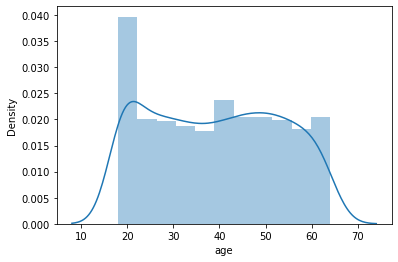

In [44]:
sns.distplot(data['age'])

In [45]:
uppper_boundary=data['age'].mean() + 3* data['age'].std()
lower_boundary=data['age'].mean() - 3* data['age'].std()
print(lower_boundary), print(uppper_boundary),print(data['age'].mean())

-2.9428557265872257
81.3569065487098
39.20702541106129


(None, None, None)

c:\users\dell\anaconda3\envs\insurancepremium\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='bmi', ylabel='Density'>

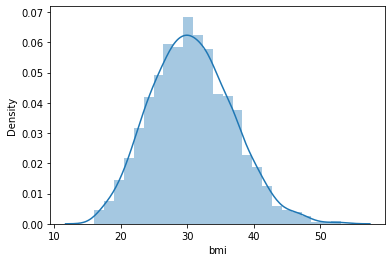

In [46]:
sns.distplot(data['bmi'])

In [47]:
#As normally distributed
uppper_boundary=data['bmi'].mean() + 3* data['bmi'].std()
lower_boundary=data['bmi'].mean() - 3* data['bmi'].std()
print(lower_boundary), print(uppper_boundary),print(data['bmi'].mean())

12.370324282007896
48.96061742202809
30.665470852017993


(None, None, None)

<AxesSubplot:>

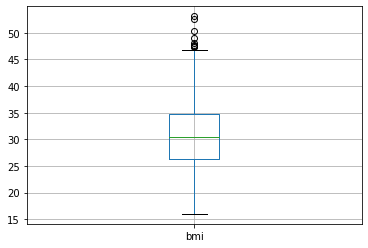

In [48]:
data.boxplot(column="bmi")

In [49]:

#### Lets compute the Interquantile range to calculate the boundaries
IQR=data.bmi.quantile(0.75)-data.bmi.quantile(0.25)
IQR

8.400000000000002

In [50]:
lower_bridge=data['bmi'].quantile(0.25)-(IQR*1.5)
upper_bridge=data['bmi'].quantile(0.75)+(IQR*1.5)
print(lower_bridge), print(upper_bridge)

13.699999999999998
47.300000000000004


(None, None)

In [51]:
#### Extreme outliers
lower_bridge=data['bmi'].quantile(0.25)-(IQR*3)
upper_bridge=data['bmi'].quantile(0.75)+(IQR*3)
print(lower_bridge), print(upper_bridge)

1.0999999999999943
59.900000000000006


(None, None)

In [52]:
data[data['bmi']>49]

,age,sex,bmi,children,smoker,region,expenses
116,58,male,49.1,0,no,southeast,11381.33
847,23,male,50.4,1,no,southeast,2438.06
1047,22,male,52.6,1,yes,southeast,44501.40
1317,18,male,53.1,0,no,southeast,1163.46


In [53]:
data.loc[data['bmi'] > 49, 'bmi'] = 49

c:\users\dell\anaconda3\envs\insurancepremium\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='bmi', ylabel='Density'>

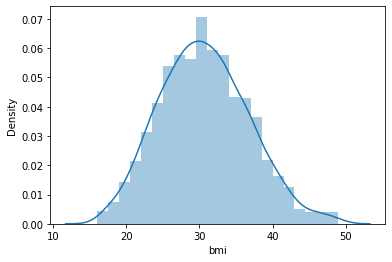

In [54]:
## As normally distributed so outliers chossen from gaussian distribution

sns.distplot(data['bmi'])

# Feature Selection

## Visual exploration of relationship between variables
## Continuous Vs Continuous ---- Scatter Plot
## Categorical Vs Continuous---- Box Plot

## Relationship exploration: Continuous Vs Continuous -- Scatter Charts

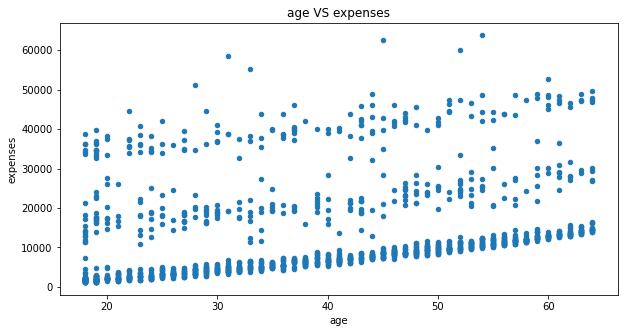

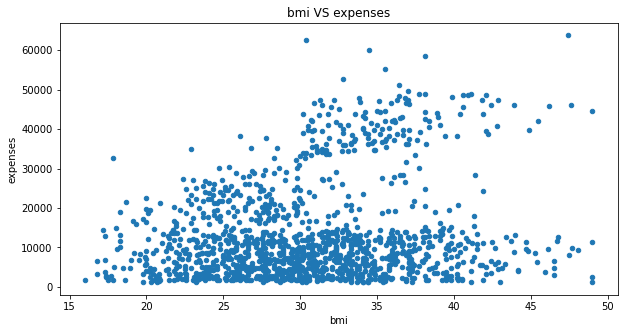

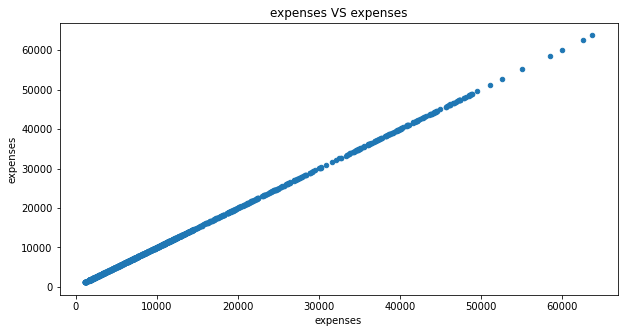

In [55]:
ContinuousCols=['age','bmi','expenses']

# Plotting scatter chart for each predictor vs the target variable
for predictor in ContinuousCols:
    data.plot.scatter(x=predictor, y='expenses', figsize=(10,5), title=predictor+" VS "+ 'expenses')

## Statistical Feature Selection (Continuous Vs Continuous) using Correlation value

In [56]:
# Calculating correlation matrix
ContinuousCols=['age','bmi','expenses']

# Creating the correlation matrix
CorrelationData=data[ContinuousCols].corr()
CorrelationData

,age,bmi,expenses
age,1.000000,0.111236,0.299008
bmi,0.111236,1.000000,0.198835
expenses,0.299008,0.198835,1.000000


### It seems age has better co-relation than BMI though we have not enough feature to create the model we supposed to tae both 

## Relationship exploration: Categorical Vs Continuous -- Box Plots

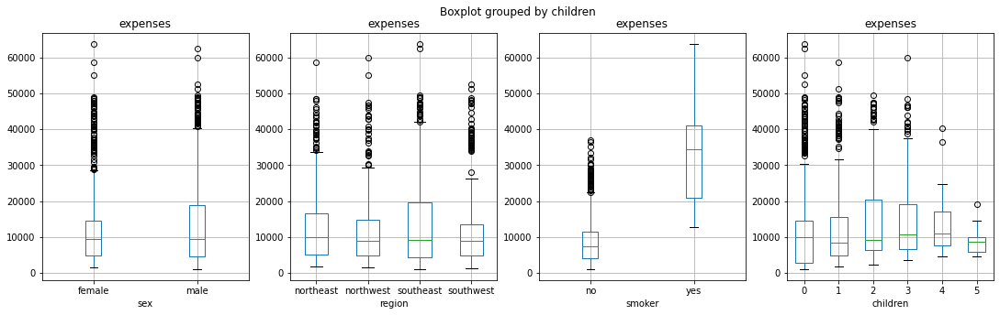

In [57]:
# Box plots for Categorical Target Variable "price" and continuous predictors
CategoricalColsList=['sex','region','smoker','children']

import matplotlib.pyplot as plt
fig, PlotCanvas=plt.subplots(nrows=1, ncols=len(CategoricalColsList), figsize=(18,5))

# Creating box plots for each continuous predictor against the Target Variable "price"
for PredictorCol , i in zip(CategoricalColsList, range(len(CategoricalColsList))):
    data.boxplot(column='expenses', by=PredictorCol, figsize=(5,5), vert=True, ax=PlotCanvas[i])

### These plots gives an idea about the data distribution of continuous predictor in the Y-axis for each of the category in the X-Axis.

### If the distribution looks similar for each category(Boxes are in the same line), that means the the continuous variable has NO effect on the target variable. Hence, the variables are not correlated to each other.

## Statistical Feature Selection (Categorical Vs Continuous) using ANOVA test

In [58]:
# Defining a function to find the statistical relationship with all the categorical variables
def FunctionAnova(inpData, TargetVariable, CategoricalPredictorList):
    from scipy.stats import f_oneway

    # Creating an empty list of final selected predictors
    SelectedPredictors=[]
    
    print('##### ANOVA Results ##### \n')
    for predictor in CategoricalPredictorList:
        CategoryGroupLists=inpData.groupby(predictor)[TargetVariable].apply(list)
        AnovaResults = f_oneway(*CategoryGroupLists)
        
        # If the ANOVA P-Value is <0.05, that means we reject H0
        if (AnovaResults[1] < 0.05):
            print(predictor, 'is correlated with', TargetVariable, '| P-Value:', AnovaResults[1])
            SelectedPredictors.append(predictor)
        else:
            print(predictor, 'is NOT correlated with', TargetVariable, '| P-Value:', AnovaResults[1])
    
    return(SelectedPredictors)

In [59]:
# Calling the function to check which categorical variables are correlated with target
CategoricalPredictorList=['sex', 'region', 'children','smoker']
FunctionAnova(inpData=data, 
              TargetVariable='expenses', 
              CategoricalPredictorList=CategoricalPredictorList)



##### ANOVA Results ##### 

sex is correlated with expenses | P-Value: 0.03613269566078172
region is correlated with expenses | P-Value: 0.030893363993447484
children is correlated with expenses | P-Value: 0.005785679109763448
smoker is correlated with expenses | P-Value: 8.271449574503961e-283


['sex', 'region', 'children', 'smoker']

In [60]:
# #Region seems not co related with target variable
# data=data.drop('region',axis=1)
# data

## DataEncoding

In [61]:
data['sex']=data['sex'].map({'male':1,'female':0})
data['smoker']=data['smoker'].map({'yes':1,'no':0})


In [62]:
data

,age,sex,bmi,children,smoker,region,expenses
0,19,0,27.9,0,1,southwest,16884.92
1,18,1,33.8,1,0,southeast,1725.55
2,28,1,33.0,3,0,southeast,4449.46
3,33,1,22.7,0,0,northwest,21984.47
4,32,1,28.9,0,0,northwest,3866.86
...,...,...,...,...,...,...,...
1333,50,1,31.0,3,0,northwest,10600.55
1334,18,0,31.9,0,0,northeast,2205.98
1335,18,0,36.9,0,0,southeast,1629.83
1336,21,0,25.8,0,0,southwest,2007.95


In [63]:
data=pd.get_dummies(data,drop_first='True')

In [64]:
data

,age,sex,bmi,children,smoker,expenses,region_northwest,region_southeast,region_southwest
0,19,0,27.9,0,1,16884.92,0,0,1
1,18,1,33.8,1,0,1725.55,0,1,0
2,28,1,33.0,3,0,4449.46,0,1,0
3,33,1,22.7,0,0,21984.47,1,0,0
4,32,1,28.9,0,0,3866.86,1,0,0
...,...,...,...,...,...,...,...,...,...
1333,50,1,31.0,3,0,10600.55,1,0,0
1334,18,0,31.9,0,0,2205.98,0,0,0
1335,18,0,36.9,0,0,1629.83,0,1,0
1336,21,0,25.8,0,0,2007.95,0,0,1


In [65]:
# separating the feature and target columns
x=data.drop('expenses',axis=1)
y=data['expenses']


In [66]:
# splitting the data for model training

# splitting the data into training and test set
from sklearn.model_selection import train_test_split
train_x,test_x,train_y,test_y=train_test_split(x,y, random_state=355 )

In [67]:
test_x

,age,sex,bmi,children,smoker,region_northwest,region_southeast,region_southwest
709,36,0,27.7,0,0,0,0,0
945,56,0,35.8,1,0,0,0,1
1177,40,0,27.4,1,0,0,0,1
1239,25,0,42.1,1,0,0,1,0
1090,47,1,36.2,0,1,0,1,0
...,...,...,...,...,...,...,...,...
1193,48,0,36.6,0,0,1,0,0
80,31,1,26.9,1,0,0,0,0
977,26,1,29.2,1,0,0,1,0
812,54,1,21.0,2,0,0,1,0


In [68]:
test_y

709      5469.01
945     11674.13
1177     6496.89
1239     3238.44
1090    41676.08
          ...   
1193     8671.19
80       4441.21
977      2902.91
812     11013.71
69      17663.14
Name: expenses, Length: 335, dtype: float64

In [151]:
data[[test_x.columns]]

KeyError: "None of [Index([('age', 'bmi', 'sex', 'children', 'smoker', 'region_northwest', 'region_southeast', 'region_southwest')], dtype='object')] are in the [columns]"

In [149]:
test_x.index

Int64Index([ 709,  945, 1177, 1239, 1090, 1073,   18, 1109, 1229,   86,
            ...
             906,  245,  873,  218,  729, 1193,   80,  977,  812,   69],
           dtype='int64', length=335)

In [115]:
con_col=train_x[['age','bmi']]

In [116]:
print(train_x.shape)
print(con_col.shape)

(1003, 8)
(1003, 2)


<AxesSubplot:>

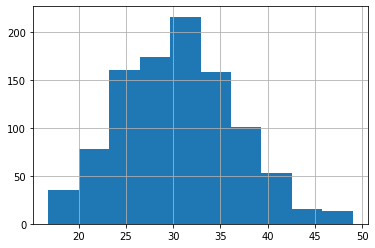

In [117]:
con_col['bmi'].hist()

In [118]:
# Scaling the numeric values in the dataset
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()

In [119]:
scaled_data=scaler.fit_transform(con_col)
scaled_num_df= pd.DataFrame(data=scaled_data, columns=con_col.columns,index=train_x.index)
scaled_num_df.shape

(1003, 2)

In [120]:
scaled_num_df.isna().sum()

age    0
bmi    0
dtype: int64

In [121]:
train_x.drop(columns=scaled_num_df.columns,inplace=True)

c:\users\dell\anaconda3\envs\insurancepremium\lib\site-packages\pandas\core\frame.py:4908: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


In [122]:
train_x

,sex,children,smoker,region_northwest,region_southeast,region_southwest
734,0,3,0,0,0,1
963,1,3,0,0,0,0
998,0,3,0,0,0,0
493,1,0,0,0,0,1
1016,0,1,0,1,0,0
...,...,...,...,...,...,...
255,0,3,0,0,0,0
51,0,2,0,1,0,0
1315,1,1,0,0,0,0
642,1,0,0,0,0,0


In [123]:
test_x

,age,sex,bmi,children,smoker,region_northwest,region_southeast,region_southwest
709,36,0,27.7,0,0,0,0,0
945,56,0,35.8,1,0,0,0,1
1177,40,0,27.4,1,0,0,0,1
1239,25,0,42.1,1,0,0,1,0
1090,47,1,36.2,0,1,0,1,0
...,...,...,...,...,...,...,...,...
1193,48,0,36.6,0,0,1,0,0
80,31,1,26.9,1,0,0,0,0
977,26,1,29.2,1,0,0,1,0
812,54,1,21.0,2,0,0,1,0


In [124]:
scaled_data=scaler.fit_transform(con_col)
scaled_num_df= pd.DataFrame(data=scaled_data, columns=con_col.columns,index=train_x.index)


In [125]:
scaled_num_df[scaled_num_df['bmi']>0]

,age,bmi
734,1.429353,0.252608
998,-0.424924,0.948578
493,1.571990,2.125097
1140,0.787488,1.081143
1111,-0.068332,1.296562
...,...,...
1249,-0.496242,0.501169
1069,1.072761,0.219467
51,-1.280743,0.501169
642,1.571990,0.550881


In [126]:
# from sklearn.preprocessing import StandardScaler
# scaler=StandardScaler()




In [127]:
train_x

,sex,children,smoker,region_northwest,region_southeast,region_southwest
734,0,3,0,0,0,1
963,1,3,0,0,0,0
998,0,3,0,0,0,0
493,1,0,0,0,0,1
1016,0,1,0,1,0,0
...,...,...,...,...,...,...
255,0,3,0,0,0,0
51,0,2,0,1,0,0
1315,1,1,0,0,0,0
642,1,0,0,0,0,0


In [128]:
train_x=pd.concat([scaled_num_df,train_x],axis=1)
train_x

,age,bmi,sex,children,smoker,region_northwest,region_southeast,region_southwest
734,1.429353,0.252608,0,3,0,0,0,1
963,0.502215,-0.957053,1,3,0,0,0,0
998,-0.424924,0.948578,0,3,0,0,0,0
493,1.571990,2.125097,1,0,0,0,0,1
1016,-1.423380,-0.990194,0,1,0,1,0,0
...,...,...,...,...,...,...,...,...
255,1.144080,-0.857629,0,3,0,0,0,0
51,-1.280743,0.501169,0,2,0,1,0,0
1315,-1.494698,-0.377078,1,1,0,0,0,0
642,1.571990,0.550881,1,0,0,0,0,0


In [129]:
num_col_test = test_x[['age','bmi']]
scaled_test_data=scaler.transform(num_col_test)

scaled_num_df_test= pd.DataFrame(data=scaled_test_data, columns=num_col_test.columns,index=test_x.index)
scaled_num_df_test

,age,bmi
709,-0.210969,-0.476503
945,1.215398,0.865724
1177,0.074305,-0.526215
1239,-0.995470,1.909678
1090,0.573533,0.932007
...,...,...
1193,0.644851,0.998290
80,-0.567560,-0.609068
977,-0.924152,-0.227942
812,1.072761,-1.586740


In [130]:
test_x.drop(columns=scaled_num_df_test.columns,inplace=True)
test_x

c:\users\dell\anaconda3\envs\insurancepremium\lib\site-packages\pandas\core\frame.py:4908: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


,sex,children,smoker,region_northwest,region_southeast,region_southwest
709,0,0,0,0,0,0
945,0,1,0,0,0,1
1177,0,1,0,0,0,1
1239,0,1,0,0,1,0
1090,1,0,1,0,1,0
...,...,...,...,...,...,...
1193,0,0,0,1,0,0
80,1,1,0,0,0,0
977,1,1,0,0,1,0
812,1,2,0,0,1,0


In [131]:
test_x=pd.concat([scaled_num_df_test,test_x],axis=1)
test_x

,age,bmi,sex,children,smoker,region_northwest,region_southeast,region_southwest
709,-0.210969,-0.476503,0,0,0,0,0,0
945,1.215398,0.865724,0,1,0,0,0,1
1177,0.074305,-0.526215,0,1,0,0,0,1
1239,-0.995470,1.909678,0,1,0,0,1,0
1090,0.573533,0.932007,1,0,1,0,1,0
...,...,...,...,...,...,...,...,...
1193,0.644851,0.998290,0,0,0,1,0,0
80,-0.567560,-0.609068,1,1,0,0,0,0
977,-0.924152,-0.227942,1,1,0,0,1,0
812,1.072761,-1.586740,1,2,0,0,1,0


In [133]:
# from sklearn.preprocessing import MinMaxScaler
# # # create target scaler object
# train_y=train_y.to_frame(name='expenses')
# target_scaler = MinMaxScaler()
# #target_scaler = MinMaxScaler()
# target_scaler.fit(train_y)

# train_y = target_scaler.transform(train_y)
# train_y











In [134]:
type(test_x)


pandas.core.frame.DataFrame

In [137]:
test_x

,age,bmi,sex,children,smoker,region_northwest,region_southeast,region_southwest
709,-0.210969,-0.476503,0,0,0,0,0,0
945,1.215398,0.865724,0,1,0,0,0,1
1177,0.074305,-0.526215,0,1,0,0,0,1
1239,-0.995470,1.909678,0,1,0,0,1,0
1090,0.573533,0.932007,1,0,1,0,1,0
...,...,...,...,...,...,...,...,...
1193,0.644851,0.998290,0,0,0,1,0,0
80,-0.567560,-0.609068,1,1,0,0,0,0
977,-0.924152,-0.227942,1,1,0,0,1,0
812,1.072761,-1.586740,1,2,0,0,1,0


In [138]:
test_x.to_csv("prediction_test_data",index=False,sep=',')


In [139]:
InputData=pd.read_csv('prediction_test_data')
InputData

,age,bmi,sex,children,smoker,region_northwest,region_southeast,region_southwest
0,-0.210969,-0.476503,0,0,0,0,0,0
1,1.215398,0.865724,0,1,0,0,0,1
2,0.074305,-0.526215,0,1,0,0,0,1
3,-0.995470,1.909678,0,1,0,0,1,0
4,0.573533,0.932007,1,0,1,0,1,0
...,...,...,...,...,...,...,...,...
330,0.644851,0.998290,0,0,0,1,0,0
331,-0.567560,-0.609068,1,1,0,0,0,0
332,-0.924152,-0.227942,1,1,0,0,1,0
333,1.072761,-1.586740,1,2,0,0,1,0


In [68]:
test_x.to_excel('prediction_dataEx',index=False)

ValueError: No engine for filetype: ''

In [65]:
!pip to install fsspec

ERROR: unknown command "to"



In [67]:
test_df=pd.read_csv(testFile)
test_df

ValueError: Invalid file path or buffer object type: <class 'NoneType'>

## Multiple Linear Regression

In [60]:
# Multiple Linear Regression
from sklearn.linear_model import LinearRegression
RegModel = LinearRegression()

# Printing all the parameters of Linear regression
print(RegModel)


# Creating the model on Training Data 
LREG=RegModel.fit(train_x,train_y)
prediction=LREG.predict(test_x)

prediction



LinearRegression()


array([ 6906.95073944, 13997.16104643,  6859.99754734,  8942.3125362 ,
       35569.28478021, 12789.86993347, 15085.38503533,  6673.9921446 ,
       13263.03241813, 36308.14334737,  7385.07847413, -1397.0955614 ,
       30719.09828888,  2405.25500927,  2204.99195041,  9170.30358488,
        5196.27432249,  3323.7629062 ,  1494.65500487,  3671.8151364 ,
       13256.18578345, 14839.39057663, 11812.76194901,  1410.61718914,
        6936.07335025, 10961.94994708, 14759.06230526,  5545.93780083,
        5645.48810436, 26922.63923497,  5267.23316363, 13593.08123832,
        9653.32371666, 14017.44750655,  8742.94055386, 37324.41546964,
       16303.77661644, 12883.32868748,  -889.78777876, 10279.87841315,
       12355.45356172,  6920.2436803 ,  3875.5838108 ,  5180.69429014,
       15108.35408827,  6493.36764798, 15675.75098385,  7183.31917834,
       32142.73960055, 29934.32069267, 26918.61060526,  5163.7081045 ,
        3105.45050064,  5089.42991206,  4316.7655741 ,  3656.1777649 ,
      

In [61]:
from sklearn import metrics
# Measuring Goodness of fit in Training data
print('R2 Value:',metrics.r2_score(train_y, LREG.predict(train_x)))

R2 Value: 0.7621929766388227


In [62]:
 LREG.predict(train_x).shape
test_y.shape

(335,)

In [63]:
LREG.score(test_x,test_y)

0.7108810836014623

In [64]:
test_y

709      5469.01
945     11674.13
1177     6496.89
1239     3238.44
1090    41676.08
          ...   
1193     8671.19
80       4441.21
977      2902.91
812     11013.71
69      17663.14
Name: expenses, Length: 335, dtype: float64

In [65]:
print('MAE:', metrics.mean_absolute_error(train_y, LREG.predict(train_x)))
print('MSE:', metrics.mean_squared_error(train_y, LREG.predict(train_x)))
print('RMSE:', np.sqrt(metrics.mean_squared_error(train_y, LREG.predict(train_x))))

MAE: 4159.5724219343165
MSE: 35367516.176043436
RMSE: 5947.059456239145


In [66]:
###########################################################################
print('\n##### Model Validation and Accuracy Calculations ##########')
TargetVariable='expenses'
# Printing some sample values of prediction
TestingDataResults=pd.DataFrame(data=test_x, columns=data.columns)
TestingDataResults[TargetVariable]=test_y
TestingDataResults[('Predicted'+TargetVariable)]=np.round(prediction)

# Printing sample prediction values
print(TestingDataResults[[TargetVariable,'Predicted'+TargetVariable]].head())


##### Model Validation and Accuracy Calculations ##########
      expenses  Predictedexpenses
709    5469.01             6907.0
945   11674.13            13997.0
1177   6496.89             6860.0
1239   3238.44             8942.0
1090  41676.08            35569.0


## Desision Tree

In [67]:
# Decision Trees (Multiple if-else statements!)
from sklearn.tree import DecisionTreeRegressor
RegModel = DecisionTreeRegressor(max_depth=10,criterion='mse')


In [68]:
train_y

734     14007.22
963      9500.57
998      6551.75
493     12574.05
1016     2709.24
          ...   
255     13047.33
51       3579.83
1315    11272.33
642     13143.86
766      8062.76
Name: expenses, Length: 1003, dtype: float64

In [69]:
# Creating the model on Training Data
DT=RegModel.fit(train_x,train_y)
prediction=DT.predict(test_x)


#print([prediction])


In [70]:
prediction.shape=(335,1)

In [71]:
from sklearn import metrics

print('MAE:', metrics.mean_absolute_error(test_y,prediction))
print('MSE:', metrics.mean_squared_error(test_y, prediction))
print('RMSE:', np.sqrt(metrics.mean_squared_error(test_y, prediction)))

MAE: 3119.527676077055
MSE: 42612830.8262329
RMSE: 6527.850398579375


In [72]:

# Hyper parameters range intialization for tuning 

parameters={"splitter":["best","random"],
            "max_depth" : [1,3,5,7,9,11,12],
           "min_samples_leaf":[1,2,3,4,5,6,7,8,9,10],
           "min_weight_fraction_leaf":[0.1,0.2,0.3,0.4,0.5],
           "max_features":["auto","log2","sqrt",None],
           "max_leaf_nodes":[None,10,20,30,40,50,60] }

In [73]:
from sklearn.model_selection import GridSearchCV
tuning_model=GridSearchCV(DT,param_grid=parameters,scoring='neg_mean_squared_error',cv=5,verbose=3)

In [74]:
# function for calculating how much time take for hyperparameter tuning

def timer(start_time=None):
    if not start_time:
        start_time=datetime.now()
        return start_time
    elif start_time:
        thour,temp_sec=divmod((datetime.now()-start_time).total_seconds(),3600)
        tmin,tsec=divmod(temp_sec,60)
        #print(thour,":",tmin,':',round(tsec,2))

In [75]:
from datetime import datetime

start_time=timer(None)

tuning_model.fit(train_x,train_y)

timer(start_time)

Fitting 5 folds for each of 19600 candidates, totalling 98000 fits
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-57033138.874 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-52840739.334 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-56141322.520 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-62173285.950 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-50011855.232 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_

[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-182719578.674 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-141629868.349 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-134675353.889 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, 

[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-62173285.950 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-50011855.232 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=

[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-62173285.950 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-50011855.232 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-57033138.874 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-52840739.334 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-56141322.520 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score

[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-168482824.109 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-142167876.878 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-137793884.206 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-141472101.189 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-135718310.657 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;

[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-62173285.950 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-50011855.232 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=

[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-52840739.334 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-56141322.520 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-62173285.950 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-50011855.232 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-57033138.874 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-52840739.334 t

[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-182719578.674 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-139738963.626 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-139599582.574 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-136

[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-62173285.950 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-50011855.232 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-128088679.9

[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-50011855.232 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-57033138.874 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-52840739.334 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-56141322.520 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-62173285.950 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-50011855

[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-121370478.262 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.8

[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-145704702.699 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-134675353.889 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-14272

[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-57033138.874 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-52840739.334 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-56141322.520 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-62173285.950 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-50011855.232 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-57033138

[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-127776424.191 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-143978914.169 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-121370478.262 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373

[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-167296103.563 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-145704702

[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-62173285.950 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-50011855.232 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-57033138.874 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-52840739.334 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-56141322.520 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-62173285.9

[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-144188606.540 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-121370478.262 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-141751223.658 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-143978914.169 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-14195

[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-182719578.674 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-137736594.003 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-1337345

[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-62173285.950 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-50011855.232 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-57033138.874 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-52840739.334 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-56141322.520 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-62173285.950 t

[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-14185

[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-135407914.935 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-137003925.249 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-128088679

[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-52840739.334 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-56141322.520 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-62173285.950 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-50011855.232 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-57033138.874 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-52840739.334 t

[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-14185

[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-144188606.540 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-134675353.889 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-129005175.136 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-143978914.169 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-13874

[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-57033138.874 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-52840739.334 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-56141322.520 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-62173285.950 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-50011855.232 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-57033138.874 tot

[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-121370478.262 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911

[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-182719578.674 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-145704702

[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-57033138.874 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-52840739.334 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-56141322.520 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-62173285.950 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-50011855.232 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-57033138

[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-143978914.169 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-121370478.262 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.2

[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-168482824.109 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-141629868.349 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-121072352.059 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-141751223.658 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-143

[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-52840739.334 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-56141322.520 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-62173285.950 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-50011855.232 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-57033138.874 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-52840739.3

[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-141472101.189 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-143978914.169 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-121370478.262 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373

[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-168817065.4

[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-62173285.950 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-50011855.232 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-57033138.874 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-52840739.334 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-56141322.520 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-62173285.9

[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-141472101.189 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-143098598.288 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-121370478.262 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373

[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-182719578.674 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-137639381.198 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-120056663.828 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-130727347.246 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-137

[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-52840739.334 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-56141322.520 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-62173285.950 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-50011855.232 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-57033138.874 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-52840739.334 t

[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-57033138.874 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-52840739.334 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-56141322.

[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-182719578.674 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-144188606.540 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-136561474.563 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-141751223.658 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-143

[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-50011855.232 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-57033138.874 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-52840739.334 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-56141322.520 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-62173285.950 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-50011855

[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-139607368.682 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-135114470.568 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-142722543.069 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-135728966.024 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-13874

[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-57033138.874 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-52840739.334 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-56141322.520 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-62173285.950 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-50011855.232 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-57033138.874 tot

[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=

[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-182719578.674 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-144188606.540 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=

[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-139738963.626 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-131088188.805 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-140988178.912 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-142369567.718 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, 

[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-137876962.991 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-62173285.950 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-143927868.344 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-169780117.775 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-137132684.459 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, sco

[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;

[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-138630497.007 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-138240016.675 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-121893881.365 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, 

[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-57033138.874 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-56141322.520 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-142722543.069 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-50011855.2

[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-127776424.191 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-171647555.267 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-142167876.878 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-137876962.991 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-128088679

[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-131859969.079 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-171647555.267 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-131933270.630 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-137876962.991 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-128088679

[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-143927868.344 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-52840739.334 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-56141322.520 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-138415219.234 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-142369567.718

[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-140084779.789 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-50011855.232 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-176602038.006 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-139424124.746 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-134675353.889 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-136626

[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-144188606.540 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-138630497.007 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-144188606

[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-14485

[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-57033138.874 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-143233670.003 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-56141322.520 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-6217328

[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-142167876.878 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-135114470.568 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-138415219.234 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-143978914.169 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-181611576.5

[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-173639616.177 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-145704702.699 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-1284614

[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-1322831

[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-171647555.267 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-131088188.805 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-138415219.234 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-138630497.007 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-182719578.6

[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-57

[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=

[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-145704702.699 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-56141322.520 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-50011855.232 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-181803768.956 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-133931220.6

[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-50011855.232 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-57033138.874 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-52840739.334 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-56141322.520 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-138415219.234 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-135681442.185 t

[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.8

[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373

[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-131933270.630 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-138415219.234 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-138630497.007 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-182719578.674 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-144188606

[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-132116190.926 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-137750130.401 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-142369567.718 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-168

[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-62173285.950 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-50011855.232 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-171647555.267 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-144188606.540 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-134675353.889 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-142722543.0

[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-56141322.520 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-140988178.912 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-50011855.232 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-57033138.874 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-143233670.003 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-134675353.

[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-56141322.520 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-138415219.234 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-50011855.232 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-181803768.956 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-143233670.003 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-56141322.

[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-177691428.403 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-56141322.520 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-62173285.950 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-138630497.007 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-57033138.874 

[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-57033138.874 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-52840739.334 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-62173285.95

[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-13193

[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-143098598.288 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-133215705.589 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-137

[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-171647555.267 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-141472101.189 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-138630497.007 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-183162950.8

[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-62173285.950 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-50011855.232 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-181803768.956 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-142167876.878 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-56141322.

[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-143233670.003 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-137876962.991 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-142369567.718 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-57033138.87

[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-142722543.069 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-171647555.267 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-128088679

[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-144188606.540 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-182719578.6

[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-52840739.334 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-138630497.007 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-57033138.874 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-13312

[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-181803768.956 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-14570

[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-144

[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-171647555.267 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-131933270.630 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-137876962.991 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-141751223.658 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-135681442.1

[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-137876962.991 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-138630497.007 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-1296041

[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-62173285.950 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-50011855.232 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-57033138.874 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-56141322.520 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-139599582

[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-141472101.189 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-143098598.288 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-1322831

[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-181803768.956 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-52840739.334 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-62173285.950 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-138630497.007 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-1

[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-52840739.334 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-56141322.520 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-140084779.789 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-50011855.232 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, sco

[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-142722543.069 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-143978914.169 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-168962028.385 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, scor

[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-182843790.908 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-138008777.126 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-131088188.805 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-139104002.514 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-141444408.551 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;

[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-121370478.262 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, sc

[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-182719578.674 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-144188606.540 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;

[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best

[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-141979138.083 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-137876962.991 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-140084779.789 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-142369567.718 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-185010615.191 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-140759825

[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-139462294.112 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-137876962.991 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-141850373

[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911

[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-52840739.334 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-131334215.452 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-140988178.912 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-136481657.183 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-131933

[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-181803768.956 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-14570

[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-134675353.889 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-135773728.722 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-182719578.674 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-1322831

[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-52840739.334 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-131334215.452 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-138415219.234 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-50011855.232 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-167782984.046 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-14162

[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-181803768.956 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-5614132

[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-138630497.007 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-181611576.516 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-141472101.189 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-144

[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-137876962.991 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-138415219.234 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-183162950.8

[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-50011855.232 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-180884985.022 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-143233670.003 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-132706881.214 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-130813

[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-144188606.540 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-134675353.889 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-141472101.189 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-144

[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-56141322.520 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-127776424.191 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-50011855.232 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-171647555.267 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-131

[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-52840739.334 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-62173285.950 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-50011855.232 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-175895066.804 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-52840739.334

[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-140656110.394 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-134688921.227 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-183

[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-131088188.805 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-142722543.069 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-142369567.718 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-172024026.8

[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-141444408.551 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-181803768.956 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-52840739.334 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-56141322.520 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-140647696.752 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-14144

[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-185010615.191 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-13874

[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-144188606.540 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-1

[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-136835279.285 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-182719578.674 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-144188606.540 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-143978914.1

[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-137876962.991 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-182719578.674 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-138213654.930 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-1313342

[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-141472101.189 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-14195

[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-138415219.234 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-182719578.6

[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-138630497.007 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-57033138.874 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-139361523.287 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-124261429.097 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-133736723.430 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-1361

[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-18316

[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-134675353.889 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-135718261.214 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-1322831

[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-138415219.234 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-57033138.874 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-144188606.540 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-132706881.214 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-141472

[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-52840739.334 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-137876962.991 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-142369567.718 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-57033138.874 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-141444829.0

[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-138630497.007 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-144188606.540 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-136

[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-140988178.912 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-141472101

[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-56141322.520 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-138415219.234 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-50011855.232 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-178725752.259 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-135957377.491 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-130670586

[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-183

[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-142722543.069 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-138630497.007 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-1346753

[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-132706881.214 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-140988178.912 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-137799255.317 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-185010615.191 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-131933270.630 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-1313342

[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-144

[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-171647555.267 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-144188606.540 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-182719578.6

[CV 3/5] END max_depth=1, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-56141322.520 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-62173285.950 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-50011855.232 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score

[CV 1/5] END max_depth=1, max_features=None, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-57033138.874 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=None, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-52840739.334 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=None, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-56141322.520 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=None, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-62173285.950 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=None, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-50011855.232 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=None, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-5703

[CV 4/5] END max_depth=1, max_features=None, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=None, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=None, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-182719578.674 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=None, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-144188606.540 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=None, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=None, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, 

[CV 2/5] END max_depth=1, max_features=None, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-52840739.334 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=None, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-56141322.520 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=None, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-62173285.950 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=None, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-50011855.232 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=None, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=None, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, scor

[CV 5/5] END max_depth=1, max_features=None, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=None, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-57033138.874 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=None, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-52840739.334 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=None, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-56141322.520 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=None, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-62173285.950 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=None, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-500

[CV 5/5] END max_depth=1, max_features=None, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=None, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-181611576.516 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=None, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-144188606.540 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=None, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-134675353.889 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=None, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-141472101.189 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=None, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;

[CV 2/5] END max_depth=1, max_features=None, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=None, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=None, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=None, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=None, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-171967084.580 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=None, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-142167876

[CV 2/5] END max_depth=1, max_features=None, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-52840739.334 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=None, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-56141322.520 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=None, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-62173285.950 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=None, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-50011855.232 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=None, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-57033138.874 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=None, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-52840739.3

[CV 2/5] END max_depth=1, max_features=None, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=None, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-121370478.262 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=None, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=None, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=None, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=None, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911

[CV 1/5] END max_depth=1, max_features=None, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-182719578.674 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=None, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-139607368.682 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=None, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-134675353.889 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=None, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-141751223.658 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=None, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-143978914.169 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=None, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-168

[CV 4/5] END max_depth=1, max_features=None, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-62173285.950 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=None, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-50011855.232 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=None, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-57033138.874 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=None, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-52840739.334 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=None, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-56141322.520 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=None, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-62173285.950 t

[CV 2/5] END max_depth=1, max_features=None, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=None, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-121370478.262 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=None, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=None, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=None, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=None, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911

[CV 4/5] END max_depth=1, max_features=None, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=None, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=None, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-168962028.385 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=None, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-144188606.540 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=None, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-134675353.889 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=None, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-14175

[CV 1/5] END max_depth=1, max_features=None, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-57033138.874 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=None, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-52840739.334 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=None, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-56141322.520 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=None, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-62173285.950 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=None, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-50011855.232 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=None, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-57033138

[CV 5/5] END max_depth=1, max_features=None, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-50011855.232 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=None, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-57033138.874 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=None, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-52840739.334 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=None, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-56141322.520 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=None, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-62173285.950 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=None, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-50011855

[CV 4/5] END max_depth=1, max_features=None, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-62173285.950 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=None, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-50011855.232 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=None, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=None, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=None, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=None, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-128088679.9

[CV 4/5] END max_depth=1, max_features=None, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=None, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=None, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-182719578.674 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=None, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-142167876.878 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=None, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-134675353.889 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=None, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-14175

[CV 5/5] END max_depth=1, max_features=None, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=None, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-57033138.874 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=None, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-52840739.334 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=None, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-56141322.520 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=None, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-62173285.950 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=None, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-50011855.232 to

[CV 2/5] END max_depth=1, max_features=None, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=None, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=None, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=None, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=None, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-182719578.674 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=None, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-144188606

[CV 5/5] END max_depth=1, max_features=None, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-50011855.232 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=None, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-57033138.874 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=None, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-52840739.334 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=None, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-56141322.520 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=None, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-62173285.950 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=None, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-50011855

[CV 2/5] END max_depth=1, max_features=None, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=None, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=None, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=None, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=None, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-57033138.874 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=None, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-528407

[CV 2/5] END max_depth=1, max_features=None, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=None, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=None, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=None, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=None, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-165960620.207 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=None, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-144188606

[CV 3/5] END max_depth=1, max_features=None, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-56141322.520 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=None, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-62173285.950 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=None, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-50011855.232 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=None, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=None, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=None, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-118754935.

[CV 3/5] END max_depth=1, max_features=None, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-56141322.520 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=None, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-62173285.950 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=None, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-50011855.232 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=None, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-57033138.874 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=None, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-52840739.334 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=None, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-56141322.520

[CV 4/5] END max_depth=1, max_features=None, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-141472101.189 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=None, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-143978914.169 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=None, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=None, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=None, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-121370478.262 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=None, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373

[CV 4/5] END max_depth=1, max_features=None, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=None, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=None, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-169392109.608 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=None, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-135957377.491 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=None, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=None, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-13540

[CV 2/5] END max_depth=1, max_features=None, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-52840739.334 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=None, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-56141322.520 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=None, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-62173285.950 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=None, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-50011855.232 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=None, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-57033138.874 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=None, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-52840739.3

[CV 5/5] END max_depth=1, max_features=None, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-143978914.169 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=None, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=None, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=None, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-121370478.262 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=None, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=None, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.2

[CV 2/5] END max_depth=1, max_features=None, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=None, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=None, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=None, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=None, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-172024026.861 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=None, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-135620329

[CV 3/5] END max_depth=1, max_features=None, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-56141322.520 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=None, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-62173285.950 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=None, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-50011855.232 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=None, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-57033138.874 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=None, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-52840739.334 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=None, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-56141322.520

[CV 1/5] END max_depth=1, max_features=None, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-167296103.563 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=None, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-144188606.540 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=None, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-135114470.568 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=None, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-141472101.189 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=None, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-143978914.169 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=None, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-183

[CV 3/5] END max_depth=1, max_features=None, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-56141322.520 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=None, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-62173285.950 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=None, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-50011855.232 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=None, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=None, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=None, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-118754935.

[CV 4/5] END max_depth=1, max_features=None, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=None, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=None, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-57033138.874 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=None, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-52840739.334 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=None, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-56141322.520 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=None, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-62173285.950

[CV 1/5] END max_depth=1, max_features=None, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=None, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=None, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=None, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=None, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=None, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-181611576.5

[CV 2/5] END max_depth=1, max_features=None, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-52840739.334 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=None, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-56141322.520 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=None, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-62173285.950 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=None, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-50011855.232 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=None, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-57033138.874 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=None, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-52840739.334 t

[CV 3/5] END max_depth=1, max_features=None, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-121370478.262 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=None, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=None, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=None, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=None, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=None, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-1322831

[CV 5/5] END max_depth=1, max_features=None, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=None, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-171277159.568 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=None, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-145704702.699 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=None, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-134675353.889 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=None, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-132231210.875 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=None, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-142

[CV 1/5] END max_depth=1, max_features=None, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=None, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=None, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=None, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=None, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=None, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-18161

[CV 3/5] END max_depth=1, max_features=None, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-121370478.262 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=None, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=None, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=None, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=None, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=None, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-1322831

[CV 4/5] END max_depth=1, max_features=None, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-62173285.950 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=None, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-50011855.232 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=None, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-57033138.874 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=None, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-52840739.334 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=None, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-56141322.520 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=None, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-62173285.9

[CV 3/5] END max_depth=1, max_features=None, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-56141322.520 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=None, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-62173285.950 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=None, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-50011855.232 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=None, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=None, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=None, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-118754935.

[CV 5/5] END max_depth=1, max_features=None, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=None, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-57033138.874 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=None, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-52840739.334 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=None, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-56141322.520 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=None, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-62173285.950 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=None, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-50011855.232 to

[CV 1/5] END max_depth=1, max_features=None, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=None, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=None, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=None, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=None, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=None, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-182719578.6

[CV 5/5] END max_depth=1, max_features=None, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-50011855.232 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=None, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-57033138.874 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=None, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-52840739.334 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=None, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-56141322.520 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=None, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-62173285.950 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=None, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-50011855

[CV 3/5] END max_depth=1, max_features=None, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=None, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=None, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-23629341.674 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-22828916.092 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-

[CV 5/5] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-137173495.676 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=

[CV 3/5] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-44790079.386 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-50088253.979 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-43588407.971 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-57211925.529 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-52554557.988 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-

[CV 3/5] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-121370478.262 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, sc

[CV 1/5] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-181611576.516 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-141145935.545 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-121474259.712 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-141472101.189 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-135163996.674 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;

[CV 1/5] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-53834419.201 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-44902869.143 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-44121529.053 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-50944515.316 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-43551820.799 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, sco

[CV 1/5] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-182719578.674 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-144188606.540 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-134675353.889 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-141472101.189 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-136835279.285 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter

[CV 1/5] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-47954705.761 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-43750449.983 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-44790079.386 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-50088253.979 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-43588407.971 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-50613949.179 tot

[CV 1/5] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-121370478.262 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.8

[CV 4/5] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-52748446.324 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-49899307.607 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-128088679.9

[CV 2/5] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-22828916.092 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-25268279.253 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-25674718.795 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-23860840.513 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-50033766.952 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-49184602.239 t

[CV 4/5] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-181611576.516 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-142167876.878 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-121446237.689 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-14147

[CV 3/5] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-23629341.674 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-22828916.092 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-252682

[CV 5/5] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-23860840.513 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-52459553.474 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-45884690.695 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-44247563.726 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-51834598.056 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-43989218

[CV 5/5] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-49899307.607 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-135681442.18

[CV 5/5] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-144

[CV 3/5] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-56879338.872 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-50462226.450 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-42623858.862 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-118754935.

[CV 2/5] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-23629341.674 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-228289

[CV 5/5] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-135401455.255 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-135681442.1

[CV 4/5] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-50088253.979 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-43588407.971 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-51512397.037 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-47935248.556 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-55837434.303 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-6200

[CV 5/5] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-144

[CV 1/5] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-182719578.6

[CV 1/5] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-121370478.262 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.8

[CV 2/5] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-23629341.674 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-228289

[CV 4/5] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-23629341.674 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-22828916.092 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-25268279.253 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-25674718.795

[CV 3/5] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-23629341.674 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-22828916.092 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-25268279.

[CV 1/5] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-173592642.848 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-147065909.877 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-134675353.889 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-142785420.391 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-143978914.169 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-168

[CV 2/5] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-43750449.983 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-44790079.386 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-50088253.979 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-43588407.971 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-48034202.640 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-47818447.841 t

[CV 4/5] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-14185

[CV 4/5] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-171805254.710 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-144188606.540 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-135114470.568 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-14147

[CV 5/5] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-23860840.513 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-47682605.335 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-46518154.765 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-50133009.941 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-50126834.750 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-47257628

[CV 3/5] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-182719578.674 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-144188606.540 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-1351144

[CV 4/5] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-50088253.979 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-43588407.971 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-51784787.268 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-46832382.710 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-46613403.747 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-61680678.4

[CV 3/5] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-23629341.674 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-22828916.092 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-252682

[CV 2/5] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-182719578.674 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-144188606

[CV 5/5] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-43588407.971 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-52286501.802 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-44451794.898 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-55837434.303 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-56229450.066 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-42567580

[CV 3/5] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-23629341.674 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-22828916.092 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-25268279.

[CV 4/5] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-130481901.133 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-143098598.288 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-128088679

[CV 3/5] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-46912879.394 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-51987824.844 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-43288369.771 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-47954705.761 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-43750449.983 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-44790079.386

[CV 4/5] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-141472101.189 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-143978914.169 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-121370478.262 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-141

[CV 5/5] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-49899307.607 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-135681442.18

[CV 4/5] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-25674718.795 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-23860840.513 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-50550579.760 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-45297011.312 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-50667780.293 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-58453647.5

[CV 3/5] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-121370478.262 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-1322831

[CV 3/5] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-134675353.889 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-141472101.189 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-136178628.111 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-1187549

[CV 3/5] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-44790079.386 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-50088253.979 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-43588407.971 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-57831114.091 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-52554557.988 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-55837434.303

[CV 4/5] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-174141083.717 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-144188606.540 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-135114470.568 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=

[CV 4/5] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, 

[CV 1/5] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-181454284.565 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-139584526.669 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-50927272.404 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-79998814.027 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-44664451.290 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, s

[CV 4/5] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-133845559.625 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-42850866.091 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-82729412.228 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-48346514.515 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-136757263.562 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, sco

[CV 5/5] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-143978914.169 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=

[CV 1/5] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-182719578.674 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-140759825.494 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-131586414.942 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-143098598.288 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;

[CV 1/5] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-179524125.558 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-45370233.024 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-122884542.624 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-140168981.924 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-130901183.994 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-

[CV 1/5] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=be

[CV 5/5] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-143978914.169 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-135114470.568 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-135681442.1

[CV 3/5] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-126404540.096 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-126862448.627 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-135459560.592 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-184945447.756 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-138742424.877 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-1325760

[CV 2/5] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-118561861.175 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-27118

[CV 5/5] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-143098598.2

[CV 5/5] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-140898356.815 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-181803768.956 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-132354749.161 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-134675353.889 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-141157569.157 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-137

[CV 2/5] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-24383961.952 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-37518180.309 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-85308500.078 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-138590036.778 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-57762223.462 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-142025294.031

[CV 1/5] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.8

[CV 1/5] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-33775511.806 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-81378898.097 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-76524152.813 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-79235754.269 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-29183786.758 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-165479112.055 to

[CV 2/5] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-147065909.877 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-120466599.403 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-140873042.968 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-131759298.298 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-182719578.674 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-13193

[CV 3/5] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-131586414.942 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-143978914.169 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-182719578.674 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-131933270.630 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-1346753

[CV 5/5] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.2

[CV 5/5] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-49039217.097 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-182719578.674 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-131933270.630 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-124355566.174 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-138630497.00

[CV 5/5] END max_depth=3, max_features=log2, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-133368063.766 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=log2, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-55294482.583 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=log2, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-49446379.526 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=log2, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-56583136.897 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=log2, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-130294120.283 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=log2, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-136350

[CV 1/5] END max_depth=3, max_features=log2, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=log2, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=log2, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=log2, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=log2, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=log2, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.8

[CV 1/5] END max_depth=3, max_features=log2, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=log2, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=log2, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-134675353.889 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=log2, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-141472101.189 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=log2, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-143098598.288 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=log2, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-182

[CV 1/5] END max_depth=3, max_features=log2, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-57033138.874 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=log2, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-137812996.275 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=log2, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-133307408.039 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=log2, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-57323608.712 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=log2, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-135054633.073 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=log2, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-174768931.911

[CV 5/5] END max_depth=3, max_features=log2, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=log2, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=log2, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=log2, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=log2, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=log2, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-144

[CV 4/5] END max_depth=3, max_features=log2, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=log2, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-138871769.279 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=log2, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=log2, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=log2, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=log2, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-141751223

[CV 3/5] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-56894029.258 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-62002338.236 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-131256043.949 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-57033138.874 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-52554557.988 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-55837434.30

[CV 1/5] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-114

[CV 2/5] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-182719578.674 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-144188606

[CV 5/5] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-141444408.551 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-171647555.267 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-131933270.630 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-137876962.991 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-135681442.1

[CV 1/5] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-57664785.383 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-52516530.373 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-50346350.602 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-131044381.000 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-44738483.804 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-1679029

[CV 2/5] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-121370478.262 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911

[CV 1/5] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-142167876.878 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-141472101.189 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-171

[CV 1/5] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-166187964.189 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-142952777.746 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-134675353.889 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-62234212.723 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-135688714.730 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-1681

[CV 4/5] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-55975156.073 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-134293504.049 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-119361247.609 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-49493915.1

[CV 2/5] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-138415219.234 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-143098598.288 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-182719578.674 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-144188606

[CV 1/5] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-167382810.985 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-144188606.540 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-134675353.889 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-132231210.875 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-141250959.452 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-168

[CV 3/5] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-125975745.307 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-29269349.808 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-29733986.549 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-183169547.288 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-95982234.325 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-9286

[CV 4/5] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-61861209.252 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-86539602.753 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-161028738.560 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-129130237.066 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-56786451.740 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-136974815.98

[CV 4/5] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-134675353.889 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-12777

[CV 3/5] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-143978914.169 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-1213704

[CV 1/5] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-104888985.734 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-24390192.016 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-120216695.967 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-26270009.914 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-129009933.149 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-54467144.090 

[CV 3/5] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-135114470.568 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-138415219.234 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-143978914.169 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-182719578.674 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-1346753

[CV 3/5] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-134675353.889 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-130528448.040 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-141486363.201 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-131933270.630 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-1187549

[CV 4/5] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-48578245.940 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-49667130.865 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-53072101.158 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-47983131.975 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-44459993.946 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-1404

[CV 5/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-143978914.169 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=

[CV 2/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-134675353.889 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-138415219.234 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-138630497.007 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-175010679.956 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, scor

[CV 2/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-140117824.113 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-78059952.745 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-138971745.520 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-132671033.498 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-178606825.652 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, s

[CV 4/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, scor

[CV 3/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-131298260.283 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-140251429.274 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-49399392.131 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-50528133.012 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-144188606.540 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, scor

[CV 4/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-141731099.671 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-50011855.232 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-137876962.991 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score

[CV 3/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=rando

[CV 1/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-135114470.568 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-183

[CV 1/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-181803768.956 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-142292498.991 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-126399196.967 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-72032052.116 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-65446721.816 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-16423

[CV 1/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-171647555.267 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-140859781.056 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-134675353.889 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-138415219.234 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-138630497.007 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-183162950.8

[CV 1/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.8

[CV 3/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-124355566.174 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-1322831

[CV 3/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-86705427.812 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-141105987.133 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-49963254.198 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-57905930.138 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-7337

[CV 4/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-141555286.885 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-143927868.344 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-171647555.267 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-144188606.540 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-138415219

[CV 1/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-114164131.029 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-144941806.914 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-118619443.099 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-62107356.931 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-86979340.978 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-177732087.726

[CV 3/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-141751223.658 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-143098598.288 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-142167876.878 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-1322831

[CV 4/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-167049703.310 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-127884739.395 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-44296080.543 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-25674718.7

[CV 5/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-49831431.930 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-166234686.540 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-137601479.507 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-135502796.213 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-128121937.187 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-45999426.492

[CV 1/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-131933270.630 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-181611576.5

[CV 5/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-138630497.007 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-134675353.889 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-144

[CV 5/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-143978914.169 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-14485

[CV 2/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-98702822.386 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-130957

[CV 2/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-144188606.540 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-135114470.568 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-141958911

[CV 3/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-132576097.593 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-62153489.650 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-141457527.917 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-182719578.674 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-131933270.630 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-13787696

[CV 1/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-175949723.252 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-62323838.125 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-134288515.989 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-61798838.593 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-129552241.381 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-17860

[CV 3/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-1322831

[CV 4/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-83497236.910 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-137939845.178 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-182312852.828 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-52840739.334 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-138723646.562 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-51471

[CV 2/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-145704702.699 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-136974815.986 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-144188606

[CV 1/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-134675353.889 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-183

[CV 2/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-121370478.262 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911

[CV 4/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-141472101.189 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-181611576.516 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-141472101

[CV 3/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-55837434.303 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-141157569.157 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-142239644.015 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-182719578.674 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-13787696

[CV 5/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-49549135.546 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-50627446.211 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-49243337.651 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-128897979.583 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-128665058.832 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-970453

[CV 5/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-50162250.725 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-168640419.740 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-125858145.947 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-56122755.148 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-133363963.701 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-1414444

[CV 1/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-179489260.627 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-141472101.189 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-143098598.288 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-171

[CV 2/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-144188606.540 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-134588974.851 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-138349166.253 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-13874

[CV 4/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-14185

[CV 4/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-138415219.234 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-182719578.674 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-14185

[CV 1/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-183

[CV 3/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-140963728.622 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-140189668.304 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-136535275.246 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-57990983.397 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-52709221.615 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-131037993

[CV 1/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-171647555.267 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-136513617.558 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-18316

[CV 1/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-182719578.674 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-143978914.169 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-183

[CV 3/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-84538515.423 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-83293209.367 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-126102557.620 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-57774235.185 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-140402508.696 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-130960753.

[CV 2/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-144188606.540 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-124355566.174 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-140168981.924 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-138630497.007 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-181611576.516 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-141958911

[CV 2/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-145773976.291 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-71677466.589 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-56124672.531 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-85584686.547 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-178521549.605 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-13627371

[CV 4/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-14185

[CV 1/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-181611576.516 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-135114470.568 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-141751223.658 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-143098598.288 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-183162950.8

[CV 2/5] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-52662084.153 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-55837434.303 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-54031987.745 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-46181431.172 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, scor

[CV 3/5] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-121370478.262 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, sc

[CV 5/5] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-43156602.551 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-47954705.761 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-43750449.983 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-44790079.386 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-50088253.979 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-4358

[CV 5/5] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-167296103.563 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-142167876.878 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-132716996.047 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-138989244.189 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;

[CV 4/5] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, 

[CV 4/5] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-25674718.795 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-23860840.513 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-55092214.519 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-46943941.370 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-50492718.962 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score

[CV 4/5] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-51716493.925 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-49280080.692 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=

[CV 5/5] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-23629341.674 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-22828916.092 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-25268279.253 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-25674718.795 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-23860840.513

[CV 3/5] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-182719578.674 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-142167876.878 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-1346753

[CV 4/5] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-50088253.979 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-43588407.971 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-57934429.547 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-46852985.210 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-55837434.303 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-53148644.5

[CV 2/5] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-23629341.674 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-228289

[CV 5/5] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-143098598.288 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-135681442.1

[CV 3/5] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-44790079.386 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-50088253.979 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-43588407.971 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-48595649.514 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-52728604.923 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-43267050.815

[CV 4/5] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-23629341.674 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-22828916.092 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-25268279.253 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-25674718.7

[CV 4/5] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-182719578.674 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-142167876.878 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-134675353.889 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-14147

[CV 4/5] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-51857007.484 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-44631958.978 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-128088679.9

[CV 5/5] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-23860840.513 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-22739363.486 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-46133264.043 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-46545416.282 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-50222598.509 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-48387746

[CV 2/5] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-144188606.540 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-134675353.889 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-141472101.189 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-143978914.169 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-14195

[CV 4/5] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-61544354.298 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-49419041.728 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-128088679.9

[CV 2/5] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-22828916.092 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-25268279.253 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-25674718.795 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-23860840.513 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-47914867.889 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-45688805.695 t

[CV 5/5] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-167296103.563 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-142167876.878 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-135114470.568 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-141472101.189 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-137

[CV 4/5] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-55288700.886 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-49751765.405 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-128088679.9

[CV 4/5] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-25674718.795 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-23860840.513 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-52857538.844 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-47277047.325 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-45206114.499 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-50069022.0

[CV 3/5] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-121370478.262 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-1322831

[CV 3/5] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-131866470.677 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-133215705.589 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-143978914.169 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-1187549

[CV 3/5] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-44790079.386 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-50088253.979 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-43588407.971 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-47603004.835 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-52525205.398 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-55695522.131

[CV 1/5] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-236

[CV 2/5] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-182719578.674 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-141629868

[CV 5/5] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-43588407.971 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-48721161.942 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-45581292.452 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-55837434.303 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-62002338.236 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-46173493

[CV 1/5] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-236

[CV 1/5] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-182719578.6

[CV 4/5] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-50088253.979 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-43588407.971 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-49651426.913 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-46108997.462 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-55631817.227 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-62052496.9

[CV 3/5] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-23629341.674 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-22828916.092 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-25268279.

[CV 3/5] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-182719578.674 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-144188606.540 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-1346753

[CV 4/5] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-50088253.979 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-43588407.971 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-57831114.091 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-52728604.923 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-45180985.998 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-56428408.7

[CV 3/5] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-23629341.674 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-22828916.092 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-25268279.

[CV 1/5] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-181611576.516 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-137816645.584 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-134675353.889 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-133790157.932 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-137292666.188 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-168

[CV 4/5] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-50982051.055 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-31370746.532 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-47954705.761 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-43750449.983 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-44790079.386 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-50088253.979 t

[CV 3/5] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-121370478.262 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-1322831

[CV 3/5] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-135114470.568 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-141472101.189 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-142239644.015 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-1187549

[CV 4/5] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-50088253.979 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-43588407.971 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-49471531.189 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-52728604.923 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-56303296.048 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-53439135.6

[CV 3/5] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-23629341.674 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-22828916.092 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-25268279.

[CV 1/5] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-47954705.761 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-43750449.983 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-44790079.386 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-50088253.979 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-43588407.971 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-57831114.091 tot

[CV 5/5] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-44340305.639 total time=   0.0s
[CV 1/5] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-135681

[CV 4/5] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-141472101.189 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-143978914.169 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, scor

[CV 3/5] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-135114470.568 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-131803704.994 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-142239644.015 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, sc

[CV 3/5] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-40592257.134 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-53273613.059 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-46655013.218 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-47954705.761 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-43750449.983 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-

[CV 5/5] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-182719578.674 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-144188606.540 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-134675353.889 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-141472101.189 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;

[CV 4/5] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-51755656.623 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-43483796.982 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=

[CV 3/5] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-171602754.259 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-141291411.364 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, sc

[CV 4/5] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-141472101.189 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-143978914.169 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-121370478.262 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, scor

[CV 1/5] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-23051355.956 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-22997157.789 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-25197931.459 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-24751986.156 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-23523731.754 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-48085391.923 tot

[CV 5/5] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-49751765.405 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-135681442.18

[CV 5/5] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-23523731.754 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-53616671.059 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-22645614.270 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-46598338.746 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-49433999.356 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-44128077

[CV 4/5] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-182719578.674 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-140945530.955 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-129604149.439 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-13223

[CV 2/5] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-43750449.983 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-44790079.386 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-50088253.979 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-43588407.971 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-51512397.037 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-52554557.988 t

[CV 1/5] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-57934429.547 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-52451323.391 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-47110484.532 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-62002338.236 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-49899307.607 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-16813320

[CV 5/5] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-133667543.654 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-135681442.1

[CV 2/5] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-121370478.262 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-141

[CV 2/5] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-44444496.343 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-43701030.778 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-50903675.443 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-42658607.005 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-47954705.761 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-43750449.9

[CV 3/5] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-134290337.706 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-143978914.169 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-1213704

[CV 3/5] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-170452336.689 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-144188606.540 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-1219052

[CV 1/5] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-47954705.761 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-43750449.983 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-44790079.386 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-50088253.979 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-43588407.971 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-51784787.268 tot

[CV 5/5] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-172458596.063 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-132729497.022 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-120422703.289 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-131425049.525 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-137

[CV 1/5] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-121370478.262 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.8

[CV 5/5] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-43588407.971 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-57475517.314 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-52554557.988 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-46613403.747 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-61544354.298 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-49899307

[CV 1/5] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-52821742.203 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-43787147.522 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-45247934.795 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-51004357.301 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-43417993.395 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-47954705

[CV 1/5] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-167782984.0

[CV 2/5] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-144188606.540 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-121370478.262 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-141472101.189 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-137173495.676 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-14195

[CV 5/5] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-23523731.754 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-52821742.203 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-44381654.848 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-44354635.919 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-49796528.505 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-49616919

[CV 5/5] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-43808332.261 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-47954705.761 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-43750449.983 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-44790079.386 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-50088253.979 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-43588407.971 tot

[CV 4/5] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-165960620.207 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-144188606.540 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-134675353.889 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-14147

[CV 2/5] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-43705777.089 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-45091012.311 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-49385684.219 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-42022540.447 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-47954705.761 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-43750449.9

[CV 5/5] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-144

[CV 5/5] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-181611576.516 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-144188606.540 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-134675353.889 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-141472101.189 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-143

[CV 1/5] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-182719578.674 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-141145935.545 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-131586414.942 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-133790157.932 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-143978914.169 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-168

[CV 3/5] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-48434514.564 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-62002338.236 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-49899307.607 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-118754935.

[CV 4/5] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-49308449.983 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-43402947.181 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-47954705.761 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-43750449.983 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-44790079.386 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-50088253

[CV 2/5] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-22997157.789 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-25197931.459 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-24751986.156 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-23523731.754 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-46621597.821 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-43964338.277 t

[CV 2/5] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-121370478.262 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911

[CV 1/5] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-50022100.922 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-43647972.062 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-46750845.785 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-51662713.018 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-24541505.270 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-47954705

[CV 5/5] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-43588407.971 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-48070881.602 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-52554557.988 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-55695522.131 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-51755656.623 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-45464977

[CV 3/5] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-121370478.262 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-1213704

[CV 5/5] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-43156602.313 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-135681442.18

[CV 1/5] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-46937063.998 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-43863924.794 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-44529536.194 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-50396038.908 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-27102162.987 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-47954705

[CV 3/5] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-121370478.262 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-1322831

[CV 5/5] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-136489558.753 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-135681442.1

[CV 1/5] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-179982059.6

[CV 5/5] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-42781446.426 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-47954705.761 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-43750449.983 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-44790079.386 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-50088253.979 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-43588407.971 tot

[CV 4/5] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-14185

[CV 5/5] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-138630497.007 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-182719578.674 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-142167876.878 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-141472101.189 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;

[CV 2/5] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-45370233.024 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-55837434.303 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-139950970.087 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-132637170.045 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-178521549.605 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, sc

[CV 3/5] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-125046293.775 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-30102748.091 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-25568693.542 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-183680328.241 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-52993532.113 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score

[CV 2/5] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, scor

[CV 4/5] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-138415219.234 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-171805254.710 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, 

[CV 2/5] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-143736597.263 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-133315291.118 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-51471375.581 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-42886814.659 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-57272849.706 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, s

[CV 4/5] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-46939969.056 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-135015308.854 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-45563771.543 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-47064882.82

[CV 5/5] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-176129901.490 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-144188606.540 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-142722543.069 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-144

[CV 3/5] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-134675353.889 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-141472101.189 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-1322831

[CV 3/5] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-128868382.905 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-29038235.330 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-129776036.794 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-161423948.966 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-52706373.770 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-56250787.

[CV 3/5] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-137173495.676 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-1378769

[CV 3/5] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-56981998.755 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-136867491.662 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-137535575.460 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-179706646.074 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-139814441.151 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-57049894

[CV 4/5] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-24327264.723 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-134711821.175 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-55528386.930 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-57397002.

[CV 5/5] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-142239644.015 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-142167876.878 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-138630497.0

[CV 3/5] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-123426210.036 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-62311719.433 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-138178816.174 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-167971443.905 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-145737901.810 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-13594461

[CV 2/5] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-24000727.405 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-235016

[CV 5/5] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-182719578.674 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-144188606.540 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-143098598.2

[CV 5/5] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-128723879.679 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-57831114.091 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-147065909.877 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-55695522.131 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-127567011.275 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-13431

[CV 2/5] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-137173113.053 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-76453805.020 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-76658492.654 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-44145356.430 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-41374764.590 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-72573932.585 

[CV 4/5] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373

[CV 1/5] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-140759825.494 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-134675353.889 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-141472101.189 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-143978914.169 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-168

[CV 3/5] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-55519885.934 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-55382597.431 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-43663472.145 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-167691116.738 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-128301958.762 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-45145152.6

[CV 1/5] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.8

[CV 5/5] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-179489260.627 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-144188606.540 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-134675353.889 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-131859969.079 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-143

[CV 3/5] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-46671259.870 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-62067133.642 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-58712397.816 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-168640419.740 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-47488460.995 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-119960171.8

[CV 2/5] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-121370478.262 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911

[CV 3/5] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-141472101.189 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-143978914.169 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-181611576.516 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-131933270.630 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-1322831

[CV 2/5] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-138515031.699 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-121765497.383 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-50088253.979 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-49899307.607 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-57831114.091 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-132458779.89

[CV 3/5] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-164383842.792 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-44850806.294 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-95544399

[CV 3/5] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-138415219.234 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-143978914.169 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-1322831

[CV 4/5] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-127600268.498 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-49899307.607 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-171130090.271 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-139182112.036 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-55837434.303 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-1312294

[CV 2/5] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-167346082.526 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-82305

[CV 5/5] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-143978914.169 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-171647555.267 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-135681442.1

[CV 4/5] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-142722543.069 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-131256043.949 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-174308763.569 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-143541947.849 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-133249909.148 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-61287

[CV 5/5] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-51287106.286 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-129944058.548 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-135202378.305 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-50198733.852 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-26249405.161 

[CV 2/5] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-134675353.889 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-14195

[CV 2/5] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-144188606.540 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-121893881.365 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-143098598.288 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-13193

[CV 3/5] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-56894029.258 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-128121937.187 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-49771992.384 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-183602529.814 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-138059020.709 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-55837434.

[CV 2/5] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-163598232.081 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-46101

[CV 5/5] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-135728966.024 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-181611576.516 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-141751223.658 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-135681442.1

[CV 3/5] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-55837434.303 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-61636847.810 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-136263010.593 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-183602529.814 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-52613454.964 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-55837434.3

[CV 2/5] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-42578689.915 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-1404

[CV 3/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-135114470.568 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-141751223.658 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-182719578.674 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-144188606.540 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, sc

[CV 1/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-134675353.889 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-141472101.189 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=

[CV 3/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-51784904.551 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-73068444.641 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-135033489.414 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-167514345.431 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-52807806.416 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score

[CV 5/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;

[CV 1/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-171647555.267 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-134675353.889 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-141751223.658 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-143098598.288 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=

[CV 5/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-131833841.207 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-182719578.674 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-143233670.003 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-131171885.179 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-55279406.258 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=ra

[CV 1/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-740

[CV 5/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-137173495.676 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-131933270.630 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-141472101.189 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-143098598.2

[CV 4/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-61653464.013 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-134696957.722 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-168930898.889 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-143980960.230 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-130127387.809 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-142785

[CV 2/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-132530476.619 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-106748206.181 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-140678276.835 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-142416719.211 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-82351880.166 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-95653278.2

[CV 2/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911

[CV 3/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-137793884.206 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-141472101.189 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-131933270.630 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-1

[CV 5/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-139179600.861 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-169881099.852 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-131954124.796 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-128518017.779 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-140760209.705 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-500

[CV 5/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-57990020.591 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-133136362.433 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-121468162.755 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-25000656.959 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-49902032.478 

[CV 5/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-143978914.169 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-182719578.674 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-144188606.540 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-135114470.568 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-141751223.658 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-143978914.1

[CV 2/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911

[CV 1/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-176371558.762 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-142057467.348 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-56413385.203 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-131608449.381 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-144532523.840 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-1816

[CV 3/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-1322831

[CV 5/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-135114470.568 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-143978914.1

[CV 1/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-175707689.740 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-52816743.392 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-132129703.612 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-140084779.789 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-136764214.033 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-1827

[CV 5/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-49114487.980 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-70407804.932 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-118673524.895 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-128869446.151 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-84671974.419 

[CV 4/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-141751223.658 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-143978914.169 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-134675353.889 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-14185

[CV 4/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-139901999.177 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-46173493.703 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-171647555.267 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-131933270.630 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-141850373.

[CV 3/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-138443731.232 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-76335602.360 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-136720151.607 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-139237292.113 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-88

[CV 4/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-136178628.111 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373

[CV 1/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-142167876.878 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-120587708.240 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-137798406.758 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-168

[CV 2/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-129019878.639 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-132576097.593 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-62002338.236 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-130901183.994 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-176437010.763 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-143233670.

[CV 3/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-173412057.530 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-31716702.087 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-11823557

[CV 4/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-135114470.568 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-14147

[CV 3/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-56141322.520 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-62002338.236 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-143098598.288 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-171647555.267 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-132

[CV 4/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-113816397.991 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-144654713.772 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-133709496.077 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-78967483.

[CV 3/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-136691036.683 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-131933270.630 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-1351144

[CV 2/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-142256193.670 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-95997013.476 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-61452657.689 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-134636314.835 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-57214048.306 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-45393038

[CV 4/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-121370478.262 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-14185

[CV 3/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-131586414.942 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-142722543.069 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-142369567.718 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-171647555.267 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-1187549

[CV 4/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-61936549.664 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-50011855.232 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-182719578.674 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-144080238.010 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-134667640.442 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-1

[CV 5/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-108618213.889 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-138950425.448 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-48375469.377 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-57836920.367 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-139629234.043

[CV 1/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-176149449.593 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-52554557.988 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-125199303.893 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-129243617.784 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-136684865.297 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-57033138.874

[CV 3/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-131586414.942 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-182719578.674 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-137812802.415 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-1330892

[CV 5/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-48809885.980 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-149050737.250 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-123100926.812 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-78961329.737 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-85259095.176 

[CV 2/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-14195

[CV 4/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-134429576.905 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-49935450.706 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-137876962.991 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-128088679.

[CV 2/5] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-22997157.789 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-25197931.459 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-24751986.156 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-23523731.754 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-48559311.595 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-47

[CV 4/5] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-58115292.300 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-49899307.607 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=

[CV 4/5] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-132217430.125 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-143098598.288 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, scor

[CV 4/5] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-134290337.706 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-143978914.169 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-121370478.262 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, scor

[CV 2/5] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-144188606.540 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-133387936.932 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-137650095.283 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-143978914.169 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, 

[CV 3/5] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-43941212.063 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-50408142.659 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-43502833.974 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score

[CV 1/5] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-23051355.956 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-22997157.789 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-25197931.459 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-24751986.156 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-23523731.754 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-4740

[CV 1/5] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-182719578.674 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-144188606.540 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-127776424.191 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-137867063.807 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter

[CV 5/5] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-23051355.956 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-22997157.789 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-25197931.459 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-24751986.156 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-23523731.754 to

[CV 4/5] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-50088253.979 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-43588407.971 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-57475517.314 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-52554557.988 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-44350897.906 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-50944431.0

[CV 1/5] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-121370478.262 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.8

[CV 3/5] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-169881099.852 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-144188606.540 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-1189566

[CV 1/5] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-47419793.460 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-44180898.756 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-43140483.512 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-57804178.900 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-43367143.182 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-47954705

[CV 4/5] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-141472101.189 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-136851178.958 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-121370478.262 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373

[CV 4/5] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-168962028.385 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-144188606.540 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-131586414.942 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-13429

[CV 1/5] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-49298642.123 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-45150963.911 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-49422371.556 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-49644983.566 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-43737208.206 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-47954705

[CV 3/5] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-131348983.755 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-141472101.189 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-137173495.676 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-1213704

[CV 1/5] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-168817065.4

[CV 1/5] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-23051355.956 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-22997157.789 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-25197931.459 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-24751986.156 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-23523731.754 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-47378533.678 tot

[CV 2/5] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-181611576.516 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-139607368

[CV 1/5] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-47954705.761 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-43750449.983 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-44790079.386 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-50088253.979 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-43588407.971 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-47361182.555 tot

[CV 4/5] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-182719578.674 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-140759825.494 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-134675353.889 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-14147

[CV 4/5] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-49736723.472 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-49899307.607 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-128088679.9

[CV 3/5] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-134675353.889 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-137284102.893 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-143978914.169 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-1213704

[CV 3/5] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-55837434.303 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-61544354.298 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-44106299.159 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-118754935.

[CV 2/5] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-22997157.789 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-25197931.459 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-24751986.156 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-23523731.754 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-49764559.958 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-43323207.346 t

[CV 4/5] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-182719578.674 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-144188606.540 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-134675353.889 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=

[CV 2/5] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-52662084.153 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-56789161.358 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-61544354.298 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-49899307.607 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-138745355

[CV 1/5] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-171805254.710 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-144188606.540 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-121388016.081 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-135606080.558 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-135718261.214 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-168

[CV 3/5] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-118976002.206 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-132231210.875 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-143978914.169 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-1213704

[CV 2/5] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-22997157.789 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-25197931.459 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-24751986.156 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-23523731.754 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-46951328.055 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-43722777.105 t

[CV 3/5] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-44790079.386 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-50088253.979 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-43588407.971 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-47890788.217 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-48250814.565 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-49412654.125

[CV 4/5] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-23051355.956 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-22997157.789 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-25197931.459 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-24751986.156

[CV 3/5] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-172422927.035 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-141145935.545 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-1

[CV 2/5] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-45324255.055 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-55631817.227 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-61544354.298 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-49899307.607 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-138745355

[CV 5/5] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-23051355.956 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-22997157.789 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-25197931.459 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-24751986.156 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-23523731.754 to

[CV 4/5] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-175130309.868 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-144188606.540 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-134675353.889 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-13776

[CV 1/5] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-49471531.189 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-46781502.415 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-44350897.906 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-62002338.236 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-43081524.926 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-16813320

[CV 3/5] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-25197931.459 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-24751986.156 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-23523731.754 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-48694520.931 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-44185786.702 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-42016824.636

[CV 3/5] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-141472101.189 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-143978914.169 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-1

[CV 3/5] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-171602754.259 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-137906986.350 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-1346753

[CV 5/5] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-44290017.389 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-47954705.761 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-43750449.983 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-44790079.386 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-50088253.979 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-43588407.971 tot

[CV 4/5] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-14185

[CV 2/5] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-131720668.076 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-134675353.889 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-141472101.189 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-143098598.288 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-13874

[CV 1/5] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-47954705.761 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-43750449.983 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-44790079.386 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-50088253.979 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-43588407.971 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-48917892.179 tot

[CV 4/5] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=

[CV 4/5] END max_depth=7, max_features=auto, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-132939671.552 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=auto, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-137867063.807 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=auto, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=auto, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=auto, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=auto, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, scor

[CV 4/5] END max_depth=7, max_features=auto, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=auto, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=auto, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=auto, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=auto, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=auto, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, 

[CV 2/5] END max_depth=7, max_features=auto, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-45095373.240 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=auto, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-45925921.342 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=auto, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-49855474.212 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=auto, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-44703601.208 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=auto, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-47954705.761 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=auto, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score

[CV 1/5] END max_depth=7, max_features=auto, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=auto, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=auto, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=auto, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=auto, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=auto, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=

[CV 1/5] END max_depth=7, max_features=auto, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-167896628.015 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=auto, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-139812897.408 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=auto, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-134675353.889 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=auto, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-137869987.950 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=auto, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-143978914.169 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=auto, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;

[CV 3/5] END max_depth=7, max_features=auto, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-45920692.273 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=auto, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-50413969.526 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=auto, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-42370586.638 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=auto, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-47954705.761 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=auto, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-43750449.983 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=auto, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-

[CV 3/5] END max_depth=7, max_features=auto, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-121370478.262 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=auto, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-141472101.189 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=auto, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-143978914.169 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=auto, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=auto, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=auto, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=bes

[CV 5/5] END max_depth=7, max_features=auto, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-43592362.234 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=auto, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=auto, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=auto, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=auto, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=auto, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-135681442.18

[CV 5/5] END max_depth=7, max_features=auto, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-23523731.754 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=auto, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-48483251.139 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=auto, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-46814943.508 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=auto, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-43509545.688 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=auto, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-51676958.175 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=auto, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-42562654

[CV 2/5] END max_depth=7, max_features=auto, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=auto, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-121370478.262 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=auto, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=auto, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=auto, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=auto, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911

[CV 2/5] END max_depth=7, max_features=auto, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=auto, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-134675353.889 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=auto, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-141751223.658 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=auto, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-135400487.685 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=auto, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=auto, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-13874

[CV 2/5] END max_depth=7, max_features=auto, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-43750449.983 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=auto, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-44790079.386 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=auto, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-50088253.979 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=auto, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-43588407.971 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=auto, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-57934429.547 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=auto, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-46275416.454 t

[CV 5/5] END max_depth=7, max_features=auto, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=auto, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=auto, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=auto, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=auto, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=auto, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, scor

[CV 3/5] END max_depth=7, max_features=auto, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-121446237.689 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=auto, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-137557104.438 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=auto, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-143978914.169 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=auto, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=auto, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=auto, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-1187549

[CV 1/5] END max_depth=7, max_features=auto, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-47954705.761 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=auto, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-43750449.983 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=auto, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-44790079.386 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=auto, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-50088253.979 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=auto, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-43588407.971 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=auto, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-57831114.091 tot

[CV 4/5] END max_depth=7, max_features=auto, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=auto, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=auto, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=auto, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=auto, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=auto, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-14185

[CV 3/5] END max_depth=7, max_features=auto, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-121370478.262 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=auto, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-141472101.189 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=auto, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-137567852.020 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=auto, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=auto, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=auto, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-1187549

[CV 2/5] END max_depth=7, max_features=auto, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-43750449.983 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=auto, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-44790079.386 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=auto, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-50088253.979 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=auto, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-43588407.971 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=auto, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-48102678.641 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=auto, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-52662084.153 t

[CV 3/5] END max_depth=7, max_features=auto, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=auto, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=auto, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=auto, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-23051355.956 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=auto, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-22997157.789 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=auto, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-251979

[CV 3/5] END max_depth=7, max_features=auto, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=auto, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=auto, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=auto, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-165960620.207 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=auto, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-144188606.540 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=auto, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-1321641

[CV 1/5] END max_depth=7, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-50469846.512 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-45958662.887 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-49760805.988 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-50797247.851 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-49899307.607 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-16813320

[CV 4/5] END max_depth=7, max_features=auto, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=auto, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=auto, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-23051355.956 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=auto, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-22997157.789 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=auto, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-25197931.459 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=auto, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-24751986.156

[CV 5/5] END max_depth=7, max_features=auto, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-134134295.054 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=auto, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=auto, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=auto, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=auto, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=auto, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-135681442.1

[CV 3/5] END max_depth=7, max_features=auto, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-44790079.386 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=auto, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-50088253.979 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=auto, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-43588407.971 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=auto, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-51512397.037 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=auto, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-45020906.104 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=auto, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-56842173.252

[CV 5/5] END max_depth=7, max_features=auto, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-143978914.169 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=auto, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=auto, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=auto, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=auto, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=auto, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-13568

[CV 3/5] END max_depth=7, max_features=auto, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-121370478.262 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=auto, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=auto, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=auto, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=auto, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=auto, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-1322831

[CV 4/5] END max_depth=7, max_features=auto, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-24751986.156 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=auto, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-23523731.754 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=auto, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-47661551.929 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=auto, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-46745662.630 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=auto, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-49489081.601 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=auto, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-50743578.3

[CV 3/5] END max_depth=7, max_features=auto, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-25197931.459 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=auto, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-24751986.156 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=auto, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-23523731.754 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=auto, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-48515015.800 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=auto, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-42625461.185 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=auto, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-55551185.522

[CV 1/5] END max_depth=7, max_features=auto, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-182719578.674 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=auto, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-141074898.147 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=auto, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-118956649.905 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=auto, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-141472101.189 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=auto, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-143098598.288 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=auto, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-183

[CV 1/5] END max_depth=7, max_features=auto, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-52209141.853 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=auto, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-52554557.988 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=auto, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-49564908.128 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=auto, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-56010162.570 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=auto, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-43273859.807 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=auto, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-16813320

[CV 4/5] END max_depth=7, max_features=auto, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=auto, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=auto, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-182719578.674 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=auto, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-144188606.540 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=auto, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-134675353.889 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=auto, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-12777

[CV 1/5] END max_depth=7, max_features=auto, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-47954705.761 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=auto, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-43750449.983 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=auto, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-44790079.386 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=auto, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-50088253.979 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=auto, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-43588407.971 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=auto, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-49353562.8

[CV 1/5] END max_depth=7, max_features=auto, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=auto, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=auto, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-121370478.262 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=auto, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=auto, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=auto, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.8

[CV 3/5] END max_depth=7, max_features=auto, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-47110484.532 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=auto, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-61544354.298 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=auto, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-49899307.607 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=auto, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=auto, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=auto, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-118754935.

[CV 2/5] END max_depth=7, max_features=auto, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-22997157.789 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=auto, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-25197931.459 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=auto, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-24751986.156 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=auto, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-23523731.754 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=auto, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-47612917.405 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=auto, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-43913650.282 t

[CV 5/5] END max_depth=7, max_features=auto, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-41813270.937 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=auto, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-47954705.761 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=auto, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-43750449.983 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=auto, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-44790079.386 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=auto, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-50088253.979 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=auto, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-43588407.971 tot

[CV 3/5] END max_depth=7, max_features=auto, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=auto, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=auto, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=auto, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-182719578.674 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=auto, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-137931309.811 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=auto, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-1346753

[CV 4/5] END max_depth=7, max_features=auto, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=auto, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=auto, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-181611576.516 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=auto, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-142167876.878 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=auto, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-121446237.689 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=auto, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-12900

[CV 5/5] END max_depth=7, max_features=auto, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=auto, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-167896628.015 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=auto, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-144188606.540 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=auto, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-134675353.889 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=auto, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-141472101.189 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=auto, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-136

[CV 5/5] END max_depth=7, max_features=auto, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-49899307.607 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=auto, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=auto, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=auto, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=auto, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=auto, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-135681442.18

[CV 5/5] END max_depth=7, max_features=auto, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-23523731.754 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=auto, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-49695332.502 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=auto, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-42832182.215 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=auto, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-45995489.816 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=auto, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-53925242.652 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=auto, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-45784212

[CV 4/5] END max_depth=7, max_features=auto, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-49823290.046 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=auto, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-44147224.516 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=auto, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=auto, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=auto, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=auto, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-128088679.9

[CV 4/5] END max_depth=7, max_features=auto, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=auto, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=auto, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-182719578.674 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=auto, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-144188606.540 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=auto, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-134675353.889 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=auto, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-14147

[CV 1/5] END max_depth=7, max_features=auto, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-48301075.573 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=auto, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-48087353.560 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=auto, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-43709168.201 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=auto, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-57262587.519 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=auto, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-43495616.574 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=auto, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-47954705

[CV 1/5] END max_depth=7, max_features=auto, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=auto, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=auto, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=auto, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=auto, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=auto, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-182719578.6

[CV 2/5] END max_depth=7, max_features=auto, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-43750449.983 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=auto, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-44790079.386 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=auto, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-50088253.979 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=auto, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-43588407.971 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=auto, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-57475517.314 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=auto, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-52662084

[CV 3/5] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-106945159.117 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-48090501.462 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, sco

[CV 5/5] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-43145496.829 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-167902904.814 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-129130237.066 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-133246318.220 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-62311719.433 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-4

[CV 4/5] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-139983986.745 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-140376282.999 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-171647555.267 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-134675353.889 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, scor

[CV 1/5] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-167296103.563 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-141751223.658 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-143978914.169 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;

[CV 2/5] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-26286302.525 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, s

[CV 3/5] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-67910494.385 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-61830341.716 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-134813048.076 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-56767431.673 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-145737901.810 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score

[CV 4/5] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-62002338.236 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-141444408.551 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-171647555.267 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-131586414.942 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score

[CV 4/5] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-141472101.189 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-139086860.322 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-171647555.267 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-131933270.630 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;

[CV 3/5] END max_depth=7, max_features=log2, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=log2, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-138415219.234 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=log2, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=log2, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=log2, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=log2, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-1322831

[CV 4/5] END max_depth=7, max_features=log2, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-49144763.896 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=log2, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-95182605.743 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=log2, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-49360072.910 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=log2, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-48989770.256 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=log2, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-119985251.126 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=log2, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-127077832.518

[CV 2/5] END max_depth=7, max_features=log2, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=log2, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=log2, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=log2, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=log2, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=log2, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911

[CV 5/5] END max_depth=7, max_features=log2, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-137403621.245 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=log2, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=log2, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-144188606.540 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=log2, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-131088188.805 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=log2, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=log2, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-143

[CV 3/5] END max_depth=7, max_features=log2, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-67255820.013 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=log2, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-61790741.749 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=log2, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-74509850.754 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=log2, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-49360072.910 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=log2, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-43750449.983 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=log2, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-132709258.62

[CV 2/5] END max_depth=7, max_features=log2, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=log2, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=log2, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=log2, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=log2, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=log2, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911

[CV 2/5] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-131933270.630 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-138415219.234 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-142239644.015 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-167902144.775 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-144188606

[CV 5/5] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-132157430.086 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-168358301.877 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-31125750.592 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-44631422.027 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-66154616.842 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-132753

[CV 3/5] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-135114470.568 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-143978914.169 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-1322831

[CV 2/5] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-142923714.102 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-144188606

[CV 5/5] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-23388932.713 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-176846219.508 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-48497059.766 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-60024932.917 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-136960626.578 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-820062

[CV 5/5] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-143978914.169 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-144188606.540 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-144

[CV 1/5] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-121370478.262 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-18316

[CV 4/5] END max_depth=7, max_features=log2, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-24573140.798 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=log2, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-28920162.483 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=log2, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-53634244.406 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=log2, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-90742521.200 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=log2, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-129763413.940 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=log2, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-76660040.

[CV 4/5] END max_depth=7, max_features=log2, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-128337321.078 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=log2, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-42886814.659 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=log2, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-57831114.091 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=log2, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-137782994.830 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=log2, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-128152964.029 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=log2, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-1344939

[CV 1/5] END max_depth=7, max_features=log2, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-179982059.630 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=log2, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=log2, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=log2, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=log2, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=log2, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-168133207.0

[CV 3/5] END max_depth=7, max_features=log2, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-43703710.981 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=log2, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-54050703.640 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=log2, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-137149442.250 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=log2, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-83640342.454 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=log2, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-133574180.507 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=log2, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-97421337.1

[CV 1/5] END max_depth=7, max_features=log2, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=log2, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-144188606.540 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=log2, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-134675353.889 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=log2, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-130727347.246 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=log2, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=log2, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-183

[CV 5/5] END max_depth=7, max_features=log2, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-132819249.828 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=log2, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-171647555.267 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=log2, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-147065909.877 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=log2, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-134675353.889 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=log2, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=log2, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-143978914.1

[CV 3/5] END max_depth=7, max_features=log2, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-125749769.903 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=log2, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-125188502.603 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=log2, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-24532243.450 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=log2, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-53803490.595 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=log2, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-141260333.390 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=log2, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-71897726.

[CV 2/5] END max_depth=7, max_features=log2, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-144188606.540 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=log2, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-119799262.495 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=log2, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=log2, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-136835279.285 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=log2, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=log2, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-14195

[CV 4/5] END max_depth=7, max_features=log2, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-135774918.151 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=log2, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-135312975.034 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=log2, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-182719578.674 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=log2, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=log2, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-137876962.991 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=log2, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-136974815

[CV 3/5] END max_depth=7, max_features=log2, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-115255004.654 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=log2, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-134667072.246 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=log2, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-126421337.203 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=log2, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-52285186.519 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=log2, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-94928775.431 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=log2, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-55541560.

[CV 2/5] END max_depth=7, max_features=log2, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-144188606.540 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=log2, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-121370478.262 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=log2, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=log2, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-143098598.288 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=log2, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=log2, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-14195

[CV 5/5] END max_depth=7, max_features=log2, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-50011855.232 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=log2, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-178521549.605 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=log2, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=log2, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=log2, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-138415219.234 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=log2, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-135681442.18

[CV 4/5] END max_depth=7, max_features=log2, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-58003207.820 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=log2, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-26965829.646 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=log2, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-175635409.612 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=log2, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-129714714.159 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=log2, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-44264199.527 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=log2, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-67414050

[CV 4/5] END max_depth=7, max_features=log2, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-138415219.234 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=log2, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-143978914.169 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=log2, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=log2, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=log2, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=log2, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-14147

[CV 4/5] END max_depth=7, max_features=log2, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=log2, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=log2, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=log2, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=log2, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=log2, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-14185

[CV 3/5] END max_depth=7, max_features=log2, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-71018737.313 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=log2, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-132439605.495 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=log2, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-44513622.745 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=log2, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-165983351.902 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=log2, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-51790316.627 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=log2, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-119923591.

[CV 1/5] END max_depth=7, max_features=log2, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=log2, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=log2, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-121370478.262 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=log2, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=log2, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=log2, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.8

[CV 1/5] END max_depth=7, max_features=log2, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=log2, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-144188606.540 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=log2, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-121446237.689 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=log2, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-138744861.437 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=log2, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=log2, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-183

[CV 5/5] END max_depth=7, max_features=log2, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-48779344.774 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=log2, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-167514345.431 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=log2, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-138515031.699 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=log2, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-56474786.794 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=log2, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-61544354.298 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=log2, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-13764905

[CV 3/5] END max_depth=7, max_features=log2, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-121370478.262 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=log2, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=log2, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=log2, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=log2, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=log2, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-1322831

[CV 2/5] END max_depth=7, max_features=log2, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=log2, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-125973656.214 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=log2, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-141472101.189 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=log2, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=log2, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=log2, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-13874

[CV 5/5] END max_depth=7, max_features=log2, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-81187542.299 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=log2, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-49360072.910 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=log2, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-132877208.274 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=log2, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-133519535.573 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=log2, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-136974815.986 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=log2, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-49899307.607 

[CV 4/5] END max_depth=7, max_features=log2, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=log2, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=log2, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=log2, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=log2, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=log2, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-14185

[CV 2/5] END max_depth=7, max_features=log2, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=log2, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=log2, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=log2, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-143978914.169 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=log2, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=log2, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-13874

[CV 5/5] END max_depth=7, max_features=log2, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-47380503.395 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=log2, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-176200163.350 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=log2, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-143736597.263 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=log2, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-118571298.419 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=log2, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-62002338.236 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=log2, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-1391058

[CV 5/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;

[CV 1/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-182719578.674 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-142167876.878 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-135114470.568 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=

[CV 5/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-138630497.007 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-172257265.283 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-47818447.841 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-131534814.649 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-137409422.443 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;,

[CV 5/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-142167876.878 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;

[CV 2/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, scor

[CV 2/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-143932167.691 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-133990199.857 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-83418842.967 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-140119151.087 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-172825064.415 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, s

[CV 1/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-178521549.605 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-144188606.540 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-137876962.991 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-140168981.924 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, 

[CV 4/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-62002338.236 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-131252731.532 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-180879795.767 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-129130237.066 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-140329172.585 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-142785420.

[CV 2/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911

[CV 1/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-175644316.318 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-134675353.889 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-141472101.189 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-139089435.025 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-182

[CV 4/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-62153489.650 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-140271836.515 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-162951034.809 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-136273714.665 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-45145152.629 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-137625613.8

[CV 4/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-14185

[CV 1/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-182719578.674 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-142167876.878 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-134675353.889 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-141751223.658 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-143098598.288 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-18316

[CV 5/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-134812389.339 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-58205450.478 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-143110950.501 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-131586414.942 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-132916478.520 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-140719748.88

[CV 1/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.8

[CV 5/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-133452823.756 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-182719578.674 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-147065909.877 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-137876962.991 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-140168981.924 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-135681442.1

[CV 5/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-107225963.327 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-144940745.818 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-41360046.251 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-127590382.898 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-138312752.41

[CV 1/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-134675353.889 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-138415219.234 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-143978914.169 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-183162950.8

[CV 1/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-57

[CV 4/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-62173285.950 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-141457527.917 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-58205450.478 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-145704702.699 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-124276410.928 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-126875198.3

[CV 3/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-134675353.889 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-138401793.489 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-1322831

[CV 2/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-131933270.630 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-142722543.069 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-182719578.674 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-139565523

[CV 1/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-56627538.841 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-143155414.630 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-122365708.112 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-134320128.461 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-68774489.584 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-49360

[CV 1/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-121370478.262 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.8

[CV 5/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-138630497.007 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-144188606.540 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-144

[CV 5/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-102048779.876 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-178142160.526 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-128771537.937 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-131334215.452 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-142722543.069 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-130901183.9

[CV 3/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-1322831

[CV 2/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-144188606.540 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-137918132.562 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-171647555.267 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-14216

[CV 2/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-52840739.334 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-56141322.520 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-142785420.391 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-139329085.292 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-183587264.515 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-131672506.0

[CV 3/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-49105202.834 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-45092103.685 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-132361285

[CV 5/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-135163996.674 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-135681442.1

[CV 2/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-52260336.451 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-56474786.794 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-137737529.633 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-136535275.246 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-183602529.814 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-143211882.2

[CV 1/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-169

[CV 1/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-147065909.877 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-141472101.189 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-143978914.169 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-182

[CV 4/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-83497236.910 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-49751765.405 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-161028738.560 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-45370233.024 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-138134379.517 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-62173285.950

[CV 1/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.8

[CV 4/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-137403621.245 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-144188606.540 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-14185

[CV 2/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-143110950.501 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-135944618.626 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-142785420.391 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-134604015.389 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-57033138.874 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-45882407.7

[CV 3/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-1322831

[CV 1/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-181611576.516 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-134675353.889 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-134429576.905 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-143978914.169 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-183

[CV 3/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-132129703.612 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-136974815.986 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-137649054.203 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-179489260.627 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-143211882.289 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-5591917

[CV 2/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-101413196.793 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-14413

[CV 1/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-144188606.540 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-137876962.991 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-143978914.169 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-182719578.6

[CV 4/5] END max_depth=7, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-50088253.979 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-43588407.971 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-49471531.189 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-52554557.988 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-56274338.535 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score

[CV 5/5] END max_depth=7, max_features=None, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=None, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=None, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=None, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=None, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=None, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;

[CV 1/5] END max_depth=7, max_features=None, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-182719578.674 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=None, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-144188606.540 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=None, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=None, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-141472101.189 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=None, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-142239644.015 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=None, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;

[CV 3/5] END max_depth=7, max_features=None, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-43436507.278 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=None, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-53696698.436 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=None, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-43752611.777 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=None, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-47954705.761 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=None, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-43750449.983 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=None, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-

[CV 5/5] END max_depth=7, max_features=None, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-138583333.563 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=None, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=None, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=None, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-121370478.262 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=None, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=None, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=

[CV 5/5] END max_depth=7, max_features=None, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-41749724.617 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=None, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=None, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=None, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=None, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=None, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-

[CV 3/5] END max_depth=7, max_features=None, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-25197931.459 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=None, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-24751986.156 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=None, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-23523731.754 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=None, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-48663430.937 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=None, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-44856099.765 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=None, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-44358563.140

[CV 5/5] END max_depth=7, max_features=None, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=None, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-181611576.516 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=None, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-144188606.540 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=None, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-122173093.358 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=None, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-141472101.189 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=None, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-143

[CV 1/5] END max_depth=7, max_features=None, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-57831114.091 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=None, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-45958662.887 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=None, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-55695522.131 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=None, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-61544354.298 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=None, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-49899307.607 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=None, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-16813320

[CV 2/5] END max_depth=7, max_features=None, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=None, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=None, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=None, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=None, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-167896628.015 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=None, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-132547702

[CV 1/5] END max_depth=7, max_features=None, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-182719578.674 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=None, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-147065909.877 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=None, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-133089263.297 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=None, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-141472101.189 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=None, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-143098598.288 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=None, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-168

[CV 1/5] END max_depth=7, max_features=None, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-182719578.674 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=None, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-142167876.878 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=None, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-134675353.889 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=None, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-141472101.189 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=None, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-143978914.169 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=None, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-183

[CV 4/5] END max_depth=7, max_features=None, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=None, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=None, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-23051355.956 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=None, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-22997157.789 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=None, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-25197931.459 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=None, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-24751986.156

[CV 5/5] END max_depth=7, max_features=None, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-143978914.169 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=None, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=None, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=None, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=None, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=None, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-13568

[CV 1/5] END max_depth=7, max_features=None, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-47954705.761 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=None, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-43750449.983 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=None, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-44790079.386 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=None, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-50088253.979 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=None, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-43588407.971 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=None, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-57934429.547 tot

[CV 3/5] END max_depth=7, max_features=None, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-121370478.262 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=None, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=None, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=None, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=None, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=None, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-1322831

[CV 5/5] END max_depth=7, max_features=None, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=None, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-172685841.548 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=None, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-142499669.940 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=None, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-133069841.447 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=None, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-130691389.319 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=None, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-143

[CV 2/5] END max_depth=7, max_features=None, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-44160396.991 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=None, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-47061203.560 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=None, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-49424856.347 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=None, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-43307008.914 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=None, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-47954705.761 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=None, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-43750449.9

[CV 3/5] END max_depth=7, max_features=None, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-134675353.889 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=None, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-141751223.658 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=None, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-143978914.169 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=None, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=None, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=None, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-1213704

[CV 4/5] END max_depth=7, max_features=None, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-61020488.726 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=None, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-44695582.112 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=None, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=None, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=None, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=None, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-12808

[CV 2/5] END max_depth=7, max_features=None, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-22997157.789 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=None, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-25197931.459 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=None, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-24751986.156 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=None, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-23523731.754 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=None, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-48248776.157 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=None, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-43536076.025 t

[CV 1/5] END max_depth=7, max_features=None, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=None, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=None, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=None, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=None, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=None, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-182719578.6

[CV 4/5] END max_depth=7, max_features=None, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-50088253.979 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=None, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-43588407.971 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=None, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-57831114.091 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=None, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-44965092.685 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=None, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-55631817.227 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=None, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-61020488.7

[CV 2/5] END max_depth=7, max_features=None, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=None, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=None, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=None, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=None, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-23051355.956 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=None, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-229971

[CV 3/5] END max_depth=7, max_features=None, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-120273727.385 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=None, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-142785420.391 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=None, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-143978914.169 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=None, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=None, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=None, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-1187549

[CV 5/5] END max_depth=7, max_features=None, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-43461047.511 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=None, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-47954705.761 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=None, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-43750449.983 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=None, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-44790079.386 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=None, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-50088253.979 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=None, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-43588407.9

[CV 4/5] END max_depth=7, max_features=None, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=None, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=None, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=None, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=None, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=None, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-14185

[CV 5/5] END max_depth=7, max_features=None, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=None, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-170452336.689 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=None, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-137608235.648 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=None, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-118956649.905 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=None, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-134290337.706 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=None, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-136

[CV 2/5] END max_depth=7, max_features=None, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=None, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=None, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=None, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=None, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-23051355.956 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=None, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-229971

[CV 5/5] END max_depth=7, max_features=None, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=None, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-171602754.259 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=None, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-140656110.394 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=None, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-129138703.248 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=None, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-130481901.133 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=None, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-137

[CV 1/5] END max_depth=7, max_features=None, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-48255579.732 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=None, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-45271288.746 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=None, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-41855228.115 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=None, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-49958107.444 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=None, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-47794638.115 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=None, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-47954705

[CV 3/5] END max_depth=7, max_features=None, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=None, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=None, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=None, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-182719578.674 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=None, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-142167876.878 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=None, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-1351144

[CV 3/5] END max_depth=7, max_features=None, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-121370478.262 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=None, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=None, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=None, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=None, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=None, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-1

[CV 2/5] END max_depth=7, max_features=None, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-22997157.789 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=None, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-25197931.459 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=None, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-24751986.156 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=None, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-23523731.754 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=None, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-47637495.925 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=None, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-45076056.442 t

[CV 3/5] END max_depth=7, max_features=None, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-44790079.386 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=None, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-50088253.979 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=None, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-43588407.971 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=None, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-57934429.547 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=None, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-52554557.988 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=None, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-55631817.227

[CV 5/5] END max_depth=7, max_features=None, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=None, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=None, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=None, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=None, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=None, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-144

[CV 2/5] END max_depth=7, max_features=None, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-137608235.648 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=None, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-135114470.568 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=None, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-131859969.079 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=None, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-137365947.854 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=None, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=None, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-13874

[CV 5/5] END max_depth=7, max_features=None, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-41093788.972 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=None, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-47954705.761 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=None, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-43750449.983 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=None, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-44790079.386 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=None, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-50088253.979 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=None, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-43588407.971 tot

[CV 3/5] END max_depth=7, max_features=None, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-121370478.262 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=None, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=None, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=None, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=None, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=None, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-1322831

[CV 5/5] END max_depth=7, max_features=None, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=None, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-168962028.385 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=None, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-144188606.540 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=None, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-134675353.889 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=None, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-134290337.706 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=None, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-143

[CV 5/5] END max_depth=7, max_features=None, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-43122961.742 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=None, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-47954705.761 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=None, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-43750449.983 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=None, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-44790079.386 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=None, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-50088253.979 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=None, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-43588407.971 tot

[CV 2/5] END max_depth=7, max_features=None, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=None, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-121370478.262 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=None, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=None, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=None, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=None, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911

[CV 5/5] END max_depth=7, max_features=None, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-44476033.425 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=None, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-47954705.761 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=None, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-43750449.983 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=None, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-44790079.386 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=None, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-50088253.979 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=None, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-43588407.971 tot

[CV 2/5] END max_depth=7, max_features=None, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=None, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=None, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=None, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=None, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-181611576.516 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=None, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-140945530

[CV 3/5] END max_depth=7, max_features=None, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=None, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=None, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=None, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-167296103.563 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=None, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-144188606.540 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=None, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-1187549

[CV 4/5] END max_depth=7, max_features=None, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-50180195.433 total time=   0.0s
[CV 5/5] END max_depth=7, max_features=None, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-44738483.804 total time=   0.0s
[CV 1/5] END max_depth=7, max_features=None, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=7, max_features=None, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=7, max_features=None, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=7, max_features=None, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-12808

[CV 4/5] END max_depth=9, max_features=auto, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=auto, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=auto, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-23051355.956 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=auto, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-22997157.789 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=auto, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-25197931.459 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=auto, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-

[CV 4/5] END max_depth=9, max_features=auto, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-141472101.189 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=auto, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-137982165.493 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=auto, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=auto, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=auto, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=auto, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, scor

[CV 4/5] END max_depth=9, max_features=auto, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-52472849.954 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=auto, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-41845986.204 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=auto, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-47954705.761 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=auto, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-43750449.983 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=auto, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-44790079.386 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=auto, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-50

[CV 1/5] END max_depth=9, max_features=auto, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=auto, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=auto, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-121370478.262 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=auto, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=auto, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=auto, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=

[CV 2/5] END max_depth=9, max_features=auto, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=auto, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=auto, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=auto, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=auto, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-167782984.046 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=auto, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, scor

[CV 5/5] END max_depth=9, max_features=auto, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-23523731.754 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=auto, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-47879258.928 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=auto, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-43657031.287 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=auto, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-43887600.592 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=auto, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-53595491.793 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=auto, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random

[CV 3/5] END max_depth=9, max_features=auto, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-133087451.535 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=auto, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-141472101.189 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=auto, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-143978914.169 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=auto, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=auto, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=auto, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-1213704

[CV 4/5] END max_depth=9, max_features=auto, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-51294313.457 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=auto, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-42623858.862 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=auto, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=auto, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=auto, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=auto, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-128088679.9

[CV 3/5] END max_depth=9, max_features=auto, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-25197931.459 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=auto, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-24751986.156 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=auto, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-23523731.754 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=auto, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-49205476.781 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=auto, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-44793588.078 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=auto, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-44658653.445

[CV 4/5] END max_depth=9, max_features=auto, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=auto, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=auto, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-182719578.674 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=auto, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-144188606.540 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=auto, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-134675353.889 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=auto, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-14147

[CV 5/5] END max_depth=9, max_features=auto, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-43588407.971 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=auto, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-50650083.972 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=auto, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-52554557.988 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=auto, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-55837434.303 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=auto, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-62002338.236 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=auto, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-42842184

[CV 3/5] END max_depth=9, max_features=auto, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=auto, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=auto, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=auto, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-23051355.956 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=auto, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-22997157.789 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=auto, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-251979

[CV 4/5] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-24751986.156 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-23523731.754 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-58083441.854 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-44025852.828 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-44309187.968 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-49788202.9

[CV 2/5] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-46745662.630 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-43886427.238 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-50283758.849 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-42971592.641 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-47954705.761 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-43750449.9

[CV 2/5] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-43750449.983 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-44790079.386 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-50088253.979 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-43588407.971 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-47603004.835 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-52554557.988 t

[CV 2/5] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-45863379.695 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-46876206.717 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-50144094.584 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-44288512.503 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-138745355

[CV 4/5] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-181611576.516 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-142167876.878 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-131586414.942 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-13585

[CV 2/5] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-167782984.046 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-144188606

[CV 3/5] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-134675353.889 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-141472101.189 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-143978914.169 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-1213704

[CV 4/5] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-14185

[CV 5/5] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-23051355.956 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-22997157.789 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-25197931.459 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-24751986.156 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-23523731.7

[CV 4/5] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-24751986.156 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-23523731.754 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-47963917.141 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-43411566.826 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-28581197.336 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-49321937.8

[CV 4/5] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-24751986.156 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-23523731.754 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-46976283.304 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-45339778.804 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-56544802.908 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-51073822.4

[CV 1/5] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-50234458.336 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-45772377.713 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-55460032.868 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-55896557.083 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-43003138.115 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-47954705

[CV 4/5] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-50088253.979 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-43588407.971 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-57475517.314 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-45013629.321 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-43652980.520 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-62002338.2

[CV 2/5] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-52554557.988 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-45180985.998 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-51135052.239 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-46173493.703 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-138745355

[CV 4/5] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-51755656.623 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-43750161.685 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-128088679.9

[CV 2/5] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-144188606.540 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-134675353.889 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-134688921.227 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-143098598.288 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-13874

[CV 5/5] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-182719578.674 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-131217231.767 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-135114470.568 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-141472101.189 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-143

[CV 4/5] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-14185

[CV 2/5] END max_depth=9, max_features=auto, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-22997157.789 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=auto, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-25197931.459 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=auto, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-24751986.156 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=auto, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-23523731.754 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=auto, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-24491028.779 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=auto, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-44033039.554 t

[CV 1/5] END max_depth=9, max_features=auto, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-47954705.761 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=auto, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-43750449.983 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=auto, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-44790079.386 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=auto, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-50088253.979 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=auto, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-43588407.971 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=auto, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-49471531.189 tot

[CV 1/5] END max_depth=9, max_features=auto, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=auto, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=auto, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-121370478.262 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=auto, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=auto, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=auto, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.8

[CV 2/5] END max_depth=9, max_features=auto, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=auto, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=auto, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=auto, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=auto, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-167902144.775 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=auto, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-144188606

[CV 4/5] END max_depth=9, max_features=auto, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-24751986.156 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=auto, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-23523731.754 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=auto, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-47420561.480 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=auto, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-44260781.763 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=auto, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-47993068.817 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=auto, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-50982478.8

[CV 1/5] END max_depth=9, max_features=auto, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=auto, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=auto, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=auto, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=auto, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=auto, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-181611576.5

[CV 4/5] END max_depth=9, max_features=auto, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=auto, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=auto, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-182719578.674 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=auto, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-142167876.878 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=auto, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-134675353.889 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=auto, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-14175

[CV 5/5] END max_depth=9, max_features=auto, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-23051355.956 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-22997157.789 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-25197931.459 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-24751986.156 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-23523731.754 t

[CV 1/5] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-182719578.6

[CV 3/5] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-44790079.386 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-50088253.979 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-43588407.971 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-57831114.091 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-45640623.878 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-46131094.428

[CV 4/5] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-14185

[CV 4/5] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-24751986.156 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-23523731.754 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-47580754.440 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-43818206.565 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-55661028.256 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-48784849.3

[CV 1/5] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-47561950.285 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-45382829.508 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-43755740.435 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-49607339.947 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-42795314.902 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-47954705

[CV 5/5] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-42911354.020 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-47954705.761 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-43750449.983 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-44790079.386 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-50088253.979 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-43588407.971 tot

[CV 1/5] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-52209141.853 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-52554557.988 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-47454993.762 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-61020488.726 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-46460964.278 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-16

[CV 1/5] END max_depth=9, max_features=auto, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-167490894.086 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=auto, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-140759825.494 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=auto, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-131586414.942 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=auto, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-138550810.637 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=auto, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-142239644.015 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=auto, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-168

[CV 2/5] END max_depth=9, max_features=auto, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=auto, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=auto, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=auto, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=auto, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-167490894.086 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=auto, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-142167876

[CV 5/5] END max_depth=9, max_features=auto, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-136851178.958 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=auto, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=auto, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=auto, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-121370478.262 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=auto, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=auto, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.2

[CV 2/5] END max_depth=9, max_features=auto, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=auto, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=auto, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=auto, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=auto, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-23051355.956 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=auto, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-229971

[CV 2/5] END max_depth=9, max_features=auto, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-22997157.789 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=auto, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-25197931.459 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=auto, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-24751986.156 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=auto, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-23523731.754 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=auto, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-50893891.540 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=auto, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-45509943.594 t

[CV 3/5] END max_depth=9, max_features=auto, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-45469575.030 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=auto, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-48590542.915 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=auto, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-44707137.903 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=auto, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-47954705.761 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=auto, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-43750449.983 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=auto, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-44790079.386

[CV 5/5] END max_depth=9, max_features=auto, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=auto, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-182719578.674 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=auto, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-140945530.955 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=auto, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-121622918.719 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=auto, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-141472101.189 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=auto, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-135

[CV 2/5] END max_depth=9, max_features=auto, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-46589569.276 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=auto, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-43074438.075 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=auto, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-54649575.233 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=auto, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-43135076.658 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=auto, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-47954705.761 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=auto, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-4375

[CV 2/5] END max_depth=9, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-123873302.677 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-141472101.189 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-142239644.015 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-181611576.516 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, 

[CV 4/5] END max_depth=9, max_features=log2, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-141472101.189 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=log2, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=log2, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=log2, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=log2, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-121370478.262 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=log2, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, scor

[CV 1/5] END max_depth=9, max_features=log2, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-173296387.217 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=log2, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-119234072.621 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=log2, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-122090552.595 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=log2, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-128093660.704 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=log2, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-132510821.874 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=log2, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=

[CV 1/5] END max_depth=9, max_features=log2, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-108786383.564 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=log2, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-136464567.245 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=log2, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-83640984.780 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=log2, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-70933751.875 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=log2, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-52663296.675 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=log2, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-18

[CV 4/5] END max_depth=9, max_features=log2, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=log2, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-143098598.288 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=log2, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-182719578.674 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=log2, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=log2, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=log2, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, 

[CV 1/5] END max_depth=9, max_features=log2, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-178063404.720 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=log2, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-144080238.010 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=log2, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-56122755.148 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=log2, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-136451420.119 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=log2, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-142369567.718 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=log2, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;,

[CV 4/5] END max_depth=9, max_features=log2, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=log2, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=log2, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-50994515.901 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=log2, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-135954929.484 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=log2, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-134827750.705 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=log2, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, s

[CV 1/5] END max_depth=9, max_features=log2, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=log2, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-144188606.540 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=log2, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-137876962.991 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=log2, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-141751223.658 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=log2, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=log2, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-183162950.8

[CV 2/5] END max_depth=9, max_features=log2, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-137167639.584 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=log2, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-125402650.178 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=log2, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-126626557.249 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=log2, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-137266919.259 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=log2, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-169478212.727 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=log2, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-144080238

[CV 1/5] END max_depth=9, max_features=log2, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=log2, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=log2, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=log2, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=log2, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=log2, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-293

[CV 4/5] END max_depth=9, max_features=log2, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-133614584.810 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=log2, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-143978914.169 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=log2, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-171647555.267 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=log2, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=log2, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-135114470.568 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=log2, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-128088679

[CV 2/5] END max_depth=9, max_features=log2, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=log2, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=log2, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-141472101.189 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=log2, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-143978914.169 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=log2, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=log2, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-14195

[CV 2/5] END max_depth=9, max_features=log2, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=log2, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=log2, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=log2, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=log2, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-164915451.829 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=log2, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-52609

[CV 2/5] END max_depth=9, max_features=log2, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-128301958.762 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=log2, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-133246318.220 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=log2, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-133002240.302 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=log2, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-136233184.465 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=log2, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-57381986.995 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=log2, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-1398

[CV 2/5] END max_depth=9, max_features=log2, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-52840739.334 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=log2, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-132346403.407 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=log2, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-130011452.880 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=log2, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-136221350.002 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=log2, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=log2, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-138745

[CV 3/5] END max_depth=9, max_features=log2, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-134675353.889 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=log2, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=log2, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-138871769.279 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=log2, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=log2, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=log2, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-1187549

[CV 4/5] END max_depth=9, max_features=log2, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-141472101.189 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=log2, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=log2, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=log2, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=log2, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-121370478.262 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=log2, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373

[CV 3/5] END max_depth=9, max_features=log2, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=log2, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=log2, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=log2, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-34470700.304 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=log2, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-69301192.928 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=log2, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-44427950.

[CV 2/5] END max_depth=9, max_features=log2, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-48429540.421 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=log2, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-97974690.717 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=log2, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-50895568.486 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=log2, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-77220548.209 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=log2, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-47954705.761 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=log2, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-131463691.

[CV 4/5] END max_depth=9, max_features=log2, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-58144844.705 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=log2, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-44035314.877 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=log2, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-57033138.874 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=log2, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-52807806.416 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=log2, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-55837434.303 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=log2, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-134688921.

[CV 5/5] END max_depth=9, max_features=log2, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-142369567.718 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=log2, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-182719578.674 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=log2, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-131217231.767 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=log2, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=log2, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-141751223.658 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=log2, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-136

[CV 5/5] END max_depth=9, max_features=log2, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-138349166.253 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=log2, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-182719578.674 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=log2, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-131933270.630 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=log2, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-137876962.991 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=log2, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-141751223.658 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=log2, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-135681442.1

[CV 3/5] END max_depth=9, max_features=log2, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-120763607.464 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=log2, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-49966731.318 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=log2, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-135660854.913 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=log2, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-182604047.645 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=log2, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-52669183.212 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=log2, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-55837434.

[CV 2/5] END max_depth=9, max_features=log2, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=log2, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=log2, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=log2, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=log2, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-106391083.372 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=log2, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-14311

[CV 2/5] END max_depth=9, max_features=log2, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=log2, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-137876962.991 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=log2, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=log2, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-143978914.169 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=log2, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=log2, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-141958911

[CV 4/5] END max_depth=9, max_features=log2, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-134144344.671 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=log2, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-49751765.405 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=log2, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-171810948.033 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=log2, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-140715270.402 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=log2, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-124929734.466 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=log2, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-620023

[CV 3/5] END max_depth=9, max_features=log2, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=log2, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=log2, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=log2, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-34916898.753 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=log2, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-133723590.636 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=log2, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-44850837

[CV 5/5] END max_depth=9, max_features=log2, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=log2, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=log2, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=log2, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-137876962.991 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=log2, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-141472101.189 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=log2, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-135681442.1

[CV 2/5] END max_depth=9, max_features=log2, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-136669120.164 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=log2, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-56981998.755 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=log2, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-126659814.472 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=log2, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-43966966.569 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=log2, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-57033138.874 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=log2, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-143214800.65

[CV 4/5] END max_depth=9, max_features=log2, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-136974815.986 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=log2, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-138630497.007 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=log2, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=log2, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=log2, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=log2, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-14147

[CV 1/5] END max_depth=9, max_features=log2, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=log2, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-139738963.626 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=log2, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=log2, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=log2, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-143978914.169 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=log2, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-183

[CV 2/5] END max_depth=9, max_features=log2, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=log2, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=log2, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=log2, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=log2, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-105866037.396 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=log2, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-13401

[CV 3/5] END max_depth=9, max_features=log2, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-130285897.252 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=log2, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-48040609.690 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=log2, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-112078904.697 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=log2, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-165009921.771 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=log2, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-134001475.767 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=log2, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-50626190

[CV 5/5] END max_depth=9, max_features=log2, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-143978914.169 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=log2, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=log2, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=log2, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=log2, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=log2, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.2

[CV 1/5] END max_depth=9, max_features=log2, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-179489260.627 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=log2, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=log2, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=log2, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=log2, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=log2, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-171

[CV 4/5] END max_depth=9, max_features=log2, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-134041390.884 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=log2, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-50031725.502 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=log2, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-57033138.874 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=log2, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-52554557.988 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=log2, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-124343811.845 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=log2, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-12995533

[CV 2/5] END max_depth=9, max_features=log2, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=log2, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=log2, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=log2, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=log2, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-32536744.502 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=log2, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-324111

[CV 5/5] END max_depth=9, max_features=log2, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-142369567.718 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=log2, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-171647555.267 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=log2, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-144188606.540 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=log2, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=log2, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-138415219.234 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=log2, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-138630497.0

[CV 3/5] END max_depth=9, max_features=log2, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-125199303.893 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=log2, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-126626557.249 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=log2, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-45999426.492 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=log2, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-182956124.751 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=log2, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-144188606.540 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=log2, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-13032712

[CV 2/5] END max_depth=9, max_features=log2, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=log2, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=log2, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=log2, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=log2, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-34476013.852 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=log2, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-113597

[CV 5/5] END max_depth=9, max_features=log2, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=log2, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-182719578.674 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=log2, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-131933270.630 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=log2, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=log2, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=log2, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-138630497.0

[CV 3/5] END max_depth=9, max_features=log2, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-55837434.303 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=log2, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-62002338.236 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=log2, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-135200636.169 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=log2, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-171277159.568 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=log2, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-52807806.416 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=log2, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-132682623.

[CV 2/5] END max_depth=9, max_features=log2, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=log2, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=log2, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=log2, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=log2, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-52748468.720 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=log2, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-129638

[CV 4/5] END max_depth=9, max_features=log2, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-138025802.925 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=log2, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-143978914.169 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=log2, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=log2, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-142167876.878 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=log2, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-137876962.991 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=log2, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-128088679

[CV 2/5] END max_depth=9, max_features=log2, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=log2, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=log2, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=log2, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=log2, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=log2, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911

[CV 5/5] END max_depth=9, max_features=log2, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-42670264.764 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=log2, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-57990020.591 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=log2, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-45139921.357 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=log2, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-56617633.890 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=log2, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-88010363.219 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=log2, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-46785645

[CV 2/5] END max_depth=9, max_features=log2, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-46841576.965 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=log2, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-131334215.452 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=log2, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-62017546.679 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=log2, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-137723394.503 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=log2, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=log2, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-1387453

[CV 1/5] END max_depth=9, max_features=log2, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=log2, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=log2, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=log2, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=log2, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-136513617.558 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=log2, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-171647555.2

[CV 3/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-131418804.377 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-77638919.505 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-44218914.447 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-178851024.747 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-70650507.821 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score

[CV 3/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, sc

[CV 5/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-141356916.969 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-171647555.267 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=

[CV 5/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-128850424.985 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-54647131.611 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-142190787.774 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-55837434.303 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-133256533.741 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, 

[CV 5/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-143978914.169 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=

[CV 5/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-141457527.917 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-129297152.129 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=

[CV 5/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-137488509.604 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-51681037.152 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-103822346.908 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-136968856.018 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-142540886.960 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-4233

[CV 5/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.2

[CV 3/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-131586414.942 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-141472101.189 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-182719578.674 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-145704702.699 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-1322831

[CV 2/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-52873835.623 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-127079655.677 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-129783506.784 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-45675734.707 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-178142160.526 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-4775928

[CV 5/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-143978914.169 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.2

[CV 3/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-131088188.805 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-142785420.391 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-182719578.674 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-140945530.955 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-1322831

[CV 2/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-46648421.335 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-95877130.630 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-141801592.542 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-49484019.076 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-49169827.827 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-137601479

[CV 1/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.8

[CV 4/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-144188606.540 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-131088188.805 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-14185

[CV 1/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-57946463.128 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-142358106.713 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-44910278.876 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-131706833.026 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-49899307.607 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-164312

[CV 4/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373

[CV 4/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-137403621.245 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-14147

[CV 2/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-144568530.902 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-124846508.816 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-135933799.658 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-82374564.981 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-182312852.828 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-142729

[CV 3/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-135460675.642 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-140691791.279 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-140869214.704 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-177691428.403 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-52728604.923 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-13108818

[CV 5/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-143978914.169 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-178521549.605 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-147065909.877 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-134675353.889 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-135681442.1

[CV 1/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-181611576.516 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-135114470.568 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-182719578.6

[CV 5/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-144

[CV 4/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-141472101

[CV 1/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-181029305.762 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-141074898.147 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-123030005.078 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-126765095.150 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-141444408.551 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-179

[CV 1/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-162387373.755 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-143591610.170 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-130358693.567 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-131267537.259 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-84989572.105 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-57624347.007

[CV 5/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-182719578.674 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-135

[CV 4/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-140988178.912 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-141356916.969 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-131933270.630 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-141850373

[CV 3/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-75823244.700 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-58951676.545 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-130340515.459 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-55538707.346 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-43382592.383 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-119292459.1

[CV 5/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-138630497.007 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-143

[CV 4/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-141444408.551 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-171647555.267 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-145704702.699 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-129297152.129 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-141850373

[CV 2/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-142192454.013 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-138208628.757 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-128436829.501 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-130301132.616 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-55747511.570 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-136672242.

[CV 2/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-120689035.549 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-141472101.189 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-14195

[CV 5/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-142550399.445 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-182719578.674 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-145704702.699 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-137876962.991 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-141472101.189 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-135681442.1

[CV 4/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-58371798.036 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-128675592.215 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-186218472.258 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-134840619.948 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-131298260.283 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-131010

[CV 2/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-14195

[CV 4/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-139912468.865 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-143927868.344 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-131933270.630 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-137876962.991 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-141472101

[CV 3/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-45230768.236 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-129531844.585 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-126676596.929 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-166063876.130 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-134091077.446 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-13116762

[CV 4/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-165960620.207 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-14147

[CV 3/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-56141322.520 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-62207981.910 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-50011855.232 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-171647555.267 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-147065909.877 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-134675353.

[CV 2/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-72974211.417 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-121623161.197 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-130529109.138 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-45019323.932 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-171621617.781 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-145133999.7

[CV 1/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-181611576.516 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-135114470.568 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-143978914.169 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-183

[CV 4/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-141472101.189 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-50011855.232 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-131088188.805 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-138415219.

[CV 2/5] END max_depth=9, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-22997157.789 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-25197931.459 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-24751986.156 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-23523731.754 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-49721808.006 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-46

[CV 4/5] END max_depth=9, max_features=None, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=None, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=None, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-182719578.674 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=None, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-142167876.878 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=None, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-137876962.991 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=None, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, 

[CV 1/5] END max_depth=9, max_features=None, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-47793717.991 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=None, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-52385912.879 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=None, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-55695522.131 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=None, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-62002338.236 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=None, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-49899307.607 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=None, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, sco

[CV 3/5] END max_depth=9, max_features=None, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=None, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=None, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=None, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-23051355.956 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=None, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-22997157.789 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=None, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, scor

[CV 4/5] END max_depth=9, max_features=None, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-132231210.875 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=None, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-143978914.169 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=None, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=None, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=None, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=None, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, scor

[CV 5/5] END max_depth=9, max_features=None, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-42117287.551 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=None, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-47954705.761 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=None, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-43750449.983 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=None, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-44790079.386 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=None, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-50088253.979 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=None, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-4358

[CV 1/5] END max_depth=9, max_features=None, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-181611576.516 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=None, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-144188606.540 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=None, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-134675353.889 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=None, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-141472101.189 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=None, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-143978914.169 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=None, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter

[CV 1/5] END max_depth=9, max_features=None, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-182719578.674 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=None, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-144188606.540 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=None, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-134675353.889 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=None, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-141472101.189 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=None, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-143978914.169 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=None, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-183

[CV 5/5] END max_depth=9, max_features=None, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=None, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-23051355.956 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=None, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-22997157.789 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=None, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-25197931.459 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=None, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-24751986.156 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=None, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-23523731.754 to

[CV 2/5] END max_depth=9, max_features=None, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-43750449.983 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=None, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-44790079.386 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=None, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-50088253.979 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=None, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-43588407.971 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=None, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-51784787.268 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=None, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-52554557.988 t

[CV 1/5] END max_depth=9, max_features=None, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-168482824.109 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=None, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-137595018.625 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=None, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-125829631.629 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=None, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-136672557.079 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=None, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-137173495.676 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=None, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-168

[CV 1/5] END max_depth=9, max_features=None, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=None, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=None, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=None, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=None, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=None, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-230

[CV 1/5] END max_depth=9, max_features=None, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-182719578.674 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=None, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-137906986.350 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=None, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-121446237.689 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=None, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-141472101.189 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=None, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-135563179.547 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=None, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-168

[CV 2/5] END max_depth=9, max_features=None, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-22997157.789 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=None, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-25197931.459 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=None, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-24751986.156 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=None, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-23523731.754 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=None, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-47514097.317 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=None, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-43948715

[CV 2/5] END max_depth=9, max_features=None, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=None, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=None, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=None, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=None, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-182719578.674 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=None, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-141145935

[CV 3/5] END max_depth=9, max_features=None, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-136483652.636 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=None, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-141472101.189 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=None, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-143978914.169 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=None, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=None, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=None, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-1187549

[CV 2/5] END max_depth=9, max_features=None, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-144188606.540 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=None, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-134675353.889 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=None, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-141472101.189 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=None, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-143098598.288 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=None, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=None, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-14195

[CV 3/5] END max_depth=9, max_features=None, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-44790079.386 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=None, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-50088253.979 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=None, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-43588407.971 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=None, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-49399152.196 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=None, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-52554557.988 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=None, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-56960234.354

[CV 4/5] END max_depth=9, max_features=None, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=None, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=None, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-182719578.674 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=None, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-144188606.540 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=None, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-134675353.889 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=None, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-14147

[CV 3/5] END max_depth=9, max_features=None, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-44790079.386 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=None, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-50088253.979 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=None, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-43588407.971 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=None, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-48721161.942 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=None, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-43656728.236 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=None, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-50214501.919

[CV 2/5] END max_depth=9, max_features=None, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-144188606.540 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=None, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-134675353.889 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=None, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-141472101.189 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=None, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-143978914.169 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=None, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=None, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-14195

[CV 3/5] END max_depth=9, max_features=None, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-54749701.159 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=None, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-54034521.270 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=None, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-42700930.033 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=None, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-47954705.761 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=None, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-43750449.983 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=None, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-44790079.386

[CV 1/5] END max_depth=9, max_features=None, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=None, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=None, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=None, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=None, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=None, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-182719578.6

[CV 3/5] END max_depth=9, max_features=None, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-51303554.645 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=None, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-55193677.973 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=None, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-46483233.043 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=None, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-47954705.761 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=None, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-43750449.983 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=None, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-44790079.386

[CV 3/5] END max_depth=9, max_features=None, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-131586414.942 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=None, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-134688921.227 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=None, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-136178628.111 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=None, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=None, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=None, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-1187549

[CV 1/5] END max_depth=9, max_features=None, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-168817065.484 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=None, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-144188606.540 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=None, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-129604149.439 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=None, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-129005175.136 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=None, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-143978914.169 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=None, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-183

[CV 3/5] END max_depth=9, max_features=None, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=None, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=None, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=None, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-23051355.956 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=None, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-22997157.789 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=None, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-25197931.

[CV 4/5] END max_depth=9, max_features=None, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-54261048.010 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=None, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-44067584.698 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=None, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-47954705.761 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=None, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-43750449.983 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=None, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-44790079.386 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=None, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-50088253.979 t

[CV 3/5] END max_depth=9, max_features=None, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-51513981.883 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=None, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-62002338.236 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=None, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-48135103.931 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=None, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=None, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=None, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-1187

[CV 4/5] END max_depth=9, max_features=None, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=None, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=None, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-23051355.956 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=None, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-22997157.789 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=None, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-25197931.459 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=None, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-24751986.156

[CV 1/5] END max_depth=9, max_features=None, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=None, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=None, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=None, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=None, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=None, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-182719578.6

[CV 4/5] END max_depth=9, max_features=None, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-50088253.979 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=None, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-43588407.971 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=None, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-49014667.886 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=None, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-46400609.276 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=None, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-55837434.303 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=None, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-52470948.8

[CV 1/5] END max_depth=9, max_features=None, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=None, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=None, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=None, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=None, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=None, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-230

[CV 2/5] END max_depth=9, max_features=None, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-141291411.364 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=None, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-137918132.562 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=None, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-141472101.189 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=None, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-143978914.169 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=None, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=None, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-13874

[CV 5/5] END max_depth=9, max_features=None, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-43547127.937 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=None, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-47954705.761 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=None, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-43750449.983 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=None, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-44790079.386 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=None, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-50088253.979 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=None, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-43588407.9

[CV 1/5] END max_depth=9, max_features=None, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=None, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=None, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-121370478.262 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=None, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=None, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=None, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.8

[CV 2/5] END max_depth=9, max_features=None, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-44635511.120 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=None, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-46616408.287 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=None, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-49855474.212 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=None, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-44301029.118 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=None, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-47954705.761 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=None, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-43750449.9

[CV 2/5] END max_depth=9, max_features=None, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-46275416.454 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=None, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-44683713.658 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=None, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-51294313.457 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=None, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-46903416.357 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=None, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=None, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-138745355

[CV 2/5] END max_depth=9, max_features=None, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-142167876.878 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=None, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-135114470.568 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=None, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-141472101.189 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=None, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-137173495.676 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=None, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=None, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-14195

[CV 3/5] END max_depth=9, max_features=None, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-56873182.649 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=None, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-62002338.236 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=None, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-46173493.703 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=None, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=None, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=None, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-118754935.

[CV 1/5] END max_depth=9, max_features=None, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-23051355.956 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=None, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-22997157.789 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=None, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-25197931.459 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=None, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-24751986.156 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=None, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-23523731.754 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=None, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-48512051.736 tot

[CV 2/5] END max_depth=9, max_features=None, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=None, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=None, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=None, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=None, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-167896628.015 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=None, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-144

[CV 4/5] END max_depth=9, max_features=None, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-50088253.979 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=None, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-43588407.971 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=None, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-57831114.091 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=None, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-52554557.988 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=None, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-44174382.031 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=None, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-62002338.2

[CV 5/5] END max_depth=9, max_features=None, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=None, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=None, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=None, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=None, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=None, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-144

[CV 5/5] END max_depth=9, max_features=None, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=None, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-182719578.674 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=None, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-144188606.540 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=None, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-135114470.568 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=None, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-141472101.189 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=None, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-143

[CV 2/5] END max_depth=9, max_features=None, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-44232432.532 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=None, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-45648220.989 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=None, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-50409719.348 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=None, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-42439738.072 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=None, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-47954705.761 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=None, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-43750449.9

[CV 4/5] END max_depth=9, max_features=None, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-141472101.189 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=None, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-143978914.169 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=None, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=None, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=None, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-121370478.262 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=None, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373

[CV 4/5] END max_depth=9, max_features=None, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-62002338.236 total time=   0.0s
[CV 5/5] END max_depth=9, max_features=None, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-42623858.862 total time=   0.0s
[CV 1/5] END max_depth=9, max_features=None, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=9, max_features=None, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=9, max_features=None, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=9, max_features=None, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-12808

[CV 1/5] END max_depth=11, max_features=auto, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-23051355.956 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=auto, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-22997157.789 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=auto, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-25197931.459 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=auto, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-24751986.156 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=auto, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-23523731.754 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=auto, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score

[CV 2/5] END max_depth=11, max_features=auto, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=auto, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=auto, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=auto, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=auto, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-182719578.674 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=auto, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;

[CV 4/5] END max_depth=11, max_features=auto, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-50088253.979 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=auto, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-43588407.971 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=auto, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-57475517.314 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=auto, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-52554557.988 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=auto, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-47454993.762 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=auto, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;,

[CV 1/5] END max_depth=11, max_features=auto, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=auto, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=auto, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=auto, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=auto, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=auto, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter

[CV 5/5] END max_depth=11, max_features=auto, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-136159300.526 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=auto, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=auto, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=auto, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=auto, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=auto, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, 

[CV 2/5] END max_depth=11, max_features=auto, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-43750449.983 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=auto, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-44790079.386 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=auto, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-50088253.979 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=auto, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-43588407.971 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=auto, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-50633223.397 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=auto, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random

[CV 2/5] END max_depth=11, max_features=auto, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=auto, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=auto, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=auto, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=auto, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-167896628.015 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=auto, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-144

[CV 2/5] END max_depth=11, max_features=auto, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=auto, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-121370478.262 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=auto, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=auto, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=auto, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=auto, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-141

[CV 2/5] END max_depth=11, max_features=auto, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-22997157.789 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=auto, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-25197931.459 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=auto, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-24751986.156 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=auto, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-23523731.754 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=auto, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-49994423.626 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=auto, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-44010219

[CV 4/5] END max_depth=11, max_features=auto, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=auto, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=auto, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-182719578.674 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=auto, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-144188606.540 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=auto, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-118976002.206 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=auto, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=

[CV 1/5] END max_depth=11, max_features=auto, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-48721161.942 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=auto, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-52662084.153 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=auto, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-56960234.354 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=auto, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-61544354.298 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=auto, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-49899307.607 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=auto, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-16

[CV 1/5] END max_depth=11, max_features=auto, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=auto, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=auto, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=auto, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=auto, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=auto, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, scor

[CV 3/5] END max_depth=11, max_features=auto, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-134675353.889 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=auto, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-141751223.658 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=auto, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-137292666.188 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=auto, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=auto, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=auto, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, sc

[CV 5/5] END max_depth=11, max_features=auto, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-43342432.650 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=auto, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-47954705.761 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=auto, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-43750449.983 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=auto, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-44790079.386 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=auto, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-50088253.979 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=auto, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-43588407.9

[CV 1/5] END max_depth=11, max_features=auto, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=auto, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=auto, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-121370478.262 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=auto, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=auto, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=auto, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-18316

[CV 2/5] END max_depth=11, max_features=auto, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=auto, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=auto, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=auto, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=auto, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-181611576.516 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=auto, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-137

[CV 4/5] END max_depth=11, max_features=auto, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-24751986.156 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=auto, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-23523731.754 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=auto, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-48450626.849 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=auto, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-43307030.198 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=auto, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-47867716.845 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=auto, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-5313

[CV 1/5] END max_depth=11, max_features=auto, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-167782984.046 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=auto, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-139607368.682 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=auto, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-130037917.831 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=auto, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-141472101.189 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=auto, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-138630497.007 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=auto, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, scor

[CV 4/5] END max_depth=11, max_features=auto, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-50088253.979 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=auto, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-43588407.971 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=auto, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-47335164.386 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=auto, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-44556557.232 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=auto, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-55695522.131 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=auto, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score

[CV 1/5] END max_depth=11, max_features=auto, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=auto, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=auto, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=auto, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=auto, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=auto, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, scor

[CV 2/5] END max_depth=11, max_features=auto, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-131772316.138 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=auto, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-134675353.889 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=auto, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-131803704.994 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=auto, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-143978914.169 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=auto, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=auto, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=

[CV 5/5] END max_depth=11, max_features=auto, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-42400747.344 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=auto, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-47954705.761 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=auto, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-43750449.983 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=auto, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-44790079.386 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=auto, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-50088253.979 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=auto, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-43588407.9

[CV 1/5] END max_depth=11, max_features=auto, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=auto, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=auto, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-121370478.262 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=auto, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=auto, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=auto, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-18316

[CV 2/5] END max_depth=11, max_features=auto, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=auto, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=auto, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=auto, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=auto, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-179982059.630 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=auto, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-147

[CV 5/5] END max_depth=11, max_features=auto, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-23523731.754 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=auto, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-49202292.425 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=auto, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-45389055.037 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=auto, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-43939386.540 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=auto, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-51219281.447 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=auto, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, sco

[CV 4/5] END max_depth=11, max_features=auto, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-50088253.979 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=auto, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-43588407.971 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=auto, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-48096794.942 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=auto, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-52554557.988 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=auto, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-49564908.128 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=auto, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-5314

[CV 1/5] END max_depth=11, max_features=auto, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-179982059.630 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=auto, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-138712930.225 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=auto, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-135114470.568 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=auto, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-141472101.189 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=auto, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-137867063.807 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=auto, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, scor

[CV 2/5] END max_depth=11, max_features=auto, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-22997157.789 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=auto, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-25197931.459 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=auto, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-24751986.156 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=auto, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-23523731.754 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=auto, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-48325093.856 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=auto, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-44706663

[CV 2/5] END max_depth=11, max_features=auto, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=auto, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=auto, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=auto, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=auto, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-166056645.751 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=auto, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-140

[CV 4/5] END max_depth=11, max_features=auto, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-50088253.979 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=auto, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-43588407.971 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=auto, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-49010175.265 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=auto, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-47935248.556 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=auto, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-43481542.020 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=auto, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-5056

[CV 5/5] END max_depth=11, max_features=auto, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=auto, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=auto, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=auto, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=auto, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=auto, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, scor

[CV 2/5] END max_depth=11, max_features=auto, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-142167876.878 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=auto, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-131586414.942 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=auto, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-136672557.079 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=auto, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-143978914.169 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=auto, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=auto, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, 

[CV 3/5] END max_depth=11, max_features=auto, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-51335601.140 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=auto, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-49875748.086 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=auto, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-43568251.655 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=auto, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-47954705.761 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=auto, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-43750449.983 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=auto, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-447900

[CV 1/5] END max_depth=11, max_features=auto, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=auto, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=auto, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-121370478.262 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=auto, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=auto, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=auto, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-18316

[CV 2/5] END max_depth=11, max_features=auto, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=auto, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=auto, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=auto, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=auto, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-172422927.035 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=auto, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-135

[CV 5/5] END max_depth=11, max_features=auto, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-23523731.754 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=auto, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-47337352.621 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=auto, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-43057887.283 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=auto, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-44188633.427 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=auto, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-49170827.848 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=auto, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-45

[CV 1/5] END max_depth=11, max_features=auto, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-182719578.674 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=auto, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-142167876.878 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=auto, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-119799262.495 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=auto, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-141472101.189 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=auto, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-143978914.169 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=auto, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, scor

[CV 2/5] END max_depth=11, max_features=auto, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-45324255.055 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=auto, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-55631817.227 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=auto, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-51294313.457 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=auto, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-49280080.692 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=auto, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=auto, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, scor

[CV 4/5] END max_depth=11, max_features=auto, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=auto, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=auto, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-23051355.956 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=auto, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-22997157.789 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=auto, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-25197931.459 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=auto, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-247519

[CV 4/5] END max_depth=11, max_features=auto, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-129005175.136 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=auto, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-143098598.288 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=auto, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=auto, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=auto, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=auto, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-128

[CV 5/5] END max_depth=11, max_features=auto, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-43335188.270 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=auto, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-47954705.761 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=auto, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-43750449.983 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=auto, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-44790079.386 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=auto, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-50088253.979 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=auto, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-43588407.9

[CV 2/5] END max_depth=11, max_features=auto, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=auto, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-121370478.262 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=auto, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=auto, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=auto, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=auto, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-141

[CV 4/5] END max_depth=11, max_features=auto, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=auto, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=auto, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-179982059.630 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=auto, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-144188606.540 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=auto, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-134675353.889 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=auto, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=

[CV 2/5] END max_depth=11, max_features=auto, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-44918782.129 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=auto, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-42457903.626 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=auto, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-50823333.325 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=auto, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-43983830.315 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=auto, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-47954705.761 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=auto, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score

[CV 4/5] END max_depth=11, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-143978914.169 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-121370478.262 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;

[CV 2/5] END max_depth=11, max_features=log2, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-142923714.102 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=log2, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-134675353.889 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=log2, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=log2, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=log2, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=log2, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;

[CV 1/5] END max_depth=11, max_features=log2, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-176582594.618 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=log2, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-45221793.607 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=log2, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-84875433.629 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=log2, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-79355532.931 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=log2, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-81569528.178 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=log2, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=bes

[CV 4/5] END max_depth=11, max_features=log2, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=log2, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-136851178.958 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=log2, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=log2, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=log2, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=log2, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;

[CV 2/5] END max_depth=11, max_features=log2, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-131933270.630 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=log2, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-131088188.805 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=log2, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=log2, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=log2, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-170702215.849 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=log2, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;

[CV 3/5] END max_depth=11, max_features=log2, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-126202640.282 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=log2, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-47502668.021 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=log2, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-75190131.856 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=log2, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-184098557.730 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=log2, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-130976148.602 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=log2, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter

[CV 5/5] END max_depth=11, max_features=log2, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-143098598.288 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=log2, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=log2, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=log2, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-121370478.262 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=log2, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=log2, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-14485

[CV 2/5] END max_depth=11, max_features=log2, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-145704702.699 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=log2, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=log2, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=log2, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-143978914.169 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=log2, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-182719578.674 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=log2, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-141

[CV 5/5] END max_depth=11, max_features=log2, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-123716528.764 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=log2, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-46944493.977 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=log2, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-69328848.009 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=log2, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-129075581.286 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=log2, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-53800835.159 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=log2, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-

[CV 3/5] END max_depth=11, max_features=log2, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-134675353.889 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=log2, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-141751223.658 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=log2, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-135773728.722 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=log2, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=log2, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=log2, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-1

[CV 1/5] END max_depth=11, max_features=log2, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-178521549.605 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=log2, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-147065909.877 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=log2, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=log2, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-141472101.189 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=log2, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-138630497.007 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=log2, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-17948

[CV 2/5] END max_depth=11, max_features=log2, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-144188606.540 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=log2, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-134675353.889 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=log2, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=log2, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-143978914.169 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=log2, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=log2, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=

[CV 5/5] END max_depth=11, max_features=log2, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=log2, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-43255472.669 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=log2, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-132532564.374 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=log2, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-28932728.251 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=log2, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-130416304.001 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=log2, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-294627

[CV 3/5] END max_depth=11, max_features=log2, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-126551597.457 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=log2, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-126862448.627 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=log2, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-44035314.877 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=log2, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-182570659.479 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=log2, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-142238653.723 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=log2, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-12

[CV 2/5] END max_depth=11, max_features=log2, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-135568838.065 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=log2, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-44790079.386 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=log2, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-61936549.664 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=log2, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-49388146.119 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=log2, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-183269164.042 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=log2, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-135639

[CV 1/5] END max_depth=11, max_features=log2, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=log2, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=log2, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=log2, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=log2, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=log2, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, scor

[CV 2/5] END max_depth=11, max_features=log2, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-131933270.630 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=log2, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=log2, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=log2, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=log2, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-167296103.563 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=log2, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-141

[CV 5/5] END max_depth=11, max_features=log2, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-139394500.514 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=log2, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-165912922.829 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=log2, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-52554557.988 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=log2, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-136279026.352 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=log2, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-62002338.236 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=log2, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=

[CV 2/5] END max_depth=11, max_features=log2, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=log2, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=log2, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=log2, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=log2, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-164009134.373 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=log2, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, scor

[CV 4/5] END max_depth=11, max_features=log2, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-141472101.189 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=log2, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-142369567.718 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=log2, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=log2, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=log2, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-135114470.568 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=log2, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-141

[CV 4/5] END max_depth=11, max_features=log2, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-46045509.363 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=log2, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-49771192.237 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=log2, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-56878859.993 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=log2, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=log2, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-133692430.628 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=log2, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-128121

[CV 2/5] END max_depth=11, max_features=log2, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=log2, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=log2, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=log2, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=log2, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=log2, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-141

[CV 1/5] END max_depth=11, max_features=log2, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-181109887.340 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=log2, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-138299709.296 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=log2, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-134513601.427 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=log2, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=log2, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-130901183.994 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=log2, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-18165

[CV 2/5] END max_depth=11, max_features=log2, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-140859781.056 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=log2, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=log2, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-138415219.234 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=log2, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=log2, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-182719578.674 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=log2, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-141

[CV 4/5] END max_depth=11, max_features=log2, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-138415219.234 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=log2, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=log2, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=log2, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=log2, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=log2, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=

[CV 3/5] END max_depth=11, max_features=log2, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=log2, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=log2, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=log2, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-167896628.015 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=log2, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-142167876.878 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=log2, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, sc

[CV 5/5] END max_depth=11, max_features=log2, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-54069079.010 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=log2, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-163940014.540 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=log2, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-132173673.171 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=log2, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-57202826.473 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=log2, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-140119513.651 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=log2, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=

[CV 5/5] END max_depth=11, max_features=log2, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-143978914.169 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=log2, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=log2, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=log2, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=log2, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=log2, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-14485

[CV 2/5] END max_depth=11, max_features=log2, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-142167876.878 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=log2, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-131586414.942 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=log2, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=log2, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=log2, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=log2, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=

[CV 5/5] END max_depth=11, max_features=log2, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-49112966.351 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=log2, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-169629877.695 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=log2, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-138118420.207 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=log2, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-134513601.427 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=log2, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-49966731.318 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=log2, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-1356814

[CV 3/5] END max_depth=11, max_features=log2, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-121370478.262 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=log2, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=log2, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=log2, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=log2, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=log2, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-1

[CV 5/5] END max_depth=11, max_features=log2, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-142369567.718 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=log2, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-182719578.674 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=log2, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=log2, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-137876962.991 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=log2, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=log2, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=

[CV 1/5] END max_depth=11, max_features=log2, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-57033138.874 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=log2, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-144188606.540 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=log2, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-127857976.870 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=log2, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-131619668.355 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=log2, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-139026812.113 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=log2, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score

[CV 4/5] END max_depth=11, max_features=log2, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=log2, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=log2, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-25622133.220 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=log2, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-116602924.743 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=log2, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-117683115.391 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=log2, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-1383

[CV 1/5] END max_depth=11, max_features=log2, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-171647555.267 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=log2, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=log2, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-137876962.991 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=log2, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=log2, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-138630497.007 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=log2, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-18316

[CV 5/5] END max_depth=11, max_features=log2, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-134775808.620 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=log2, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-177648066.323 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=log2, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-52840739.334 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=log2, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-132260403.008 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=log2, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-141472101.189 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=log2, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score

[CV 3/5] END max_depth=11, max_features=log2, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=log2, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=log2, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=log2, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-163450458.020 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=log2, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-46196494.471 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=log2, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-12

[CV 3/5] END max_depth=11, max_features=log2, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=log2, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-141751223.658 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=log2, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=log2, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=log2, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-144188606.540 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=log2, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, sc

[CV 1/5] END max_depth=11, max_features=log2, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-181654459.558 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=log2, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-52515277.279 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=log2, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-135114470.568 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=log2, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-141751223.658 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=log2, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-139400836.532 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=log2, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score

[CV 4/5] END max_depth=11, max_features=log2, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=log2, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=log2, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-164806991.594 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=log2, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-137777078.460 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=log2, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-125024516.814 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=log2, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-602

[CV 3/5] END max_depth=11, max_features=log2, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=log2, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=log2, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-138630497.007 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=log2, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-182719578.674 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=log2, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=log2, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-1

[CV 5/5] END max_depth=11, max_features=log2, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-131517117.927 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=log2, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-57506540.900 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=log2, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-144080238.010 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=log2, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-134675353.889 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=log2, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-140204169.380 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=log2, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score

[CV 3/5] END max_depth=11, max_features=log2, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=log2, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=log2, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=log2, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=log2, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=log2, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-1

[CV 5/5] END max_depth=11, max_features=log2, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-43588407.971 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=log2, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-182604047.645 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=log2, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-142586312.681 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=log2, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-131334215.452 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=log2, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-126626557.249 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=log2, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;,

[CV 3/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-134675353.889 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-141472101.189 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=bes

[CV 3/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-162437854.663 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-133496848.649 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=bes

[CV 1/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-169142736.238 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-145046202.965 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-82087044.789 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-131921548.211 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-134978754.211 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=

[CV 5/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-143978914.169 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-131933270.630 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-138415219.234 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, 

[CV 3/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-138511519.028 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-140168981.924 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-50011855.232 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-181799069.659 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-52840739.334 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;

[CV 4/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=ran

[CV 3/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-134675353.889 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-143978914.169 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-171647555.267 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitt

[CV 1/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-49360072.910 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-52554557.988 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-120107229.243 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-61544354.298 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-138447472.375 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-16643243

[CV 4/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=

[CV 4/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-143978914.169 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-182719578.674 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-138

[CV 1/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-57360269.412 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-136038940.967 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-133692430.628 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-134144344.671 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-49751765.405 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-5750654

[CV 1/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, scor

[CV 4/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-141472101.189 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-142167876.878 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, scor

[CV 1/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-168171711.686 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-56977644.311 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-127077832.518 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-143993718.383 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-489899

[CV 1/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, scor

[CV 5/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-131933270.630 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-135114470.568 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-141751223.658 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-13863

[CV 2/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-144188606.540 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-55837434.303 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-142785420.391 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-140854306.500 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-

[CV 5/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-74100361.963 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-131562773.239 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-117394889.447 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-81295034.275 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-4288736

[CV 1/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-171647555.267 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-131933270.630 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-143978914.169 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=

[CV 1/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-142167876.878 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-137876962.991 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-141472101.189 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-18316

[CV 2/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-141

[CV 4/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-61908136.042 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-109109437.394 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-185010615.191 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-73570892.346 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-56125115.159 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-51

[CV 4/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-143978914.169 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=

[CV 2/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-139041035.057 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-131814768.441 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-140619032.302 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-135546455.730 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-178606825.652 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=

[CV 5/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-14485

[CV 3/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-131586414.942 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-143978914.169 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-182719578.674 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-139201725.336 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, sc

[CV 3/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-117822345.284 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-138621337.656 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-50030426.014 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-169629877.695 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-138581580.689 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-13

[CV 2/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-121370478.262 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-141

[CV 5/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-143978914.169 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-131088188.805 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, scor

[CV 4/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-130532165.289 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-132221599.270 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-164312390.290 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-139134902.836 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-123533061.825 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-127

[CV 1/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-18316

[CV 5/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-171967084.580 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-145704702.699 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;

[CV 3/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-80795589.620 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-136259036.346 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-82134072.838 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-178504705.049 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-145962929.794 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-557

[CV 4/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-121370478.262 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-141

[CV 2/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-48016556.501 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-134544266.062 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-47076248.227 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-134234616.207 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-83156080.822 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-138545

[CV 2/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-52554557.988 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-56786451.740 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-61936549.664 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-130901183.994 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-57831114.091 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-1343602

[CV 4/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-141751223.658 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-141

[CV 2/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-141979138.083 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-134675353.889 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-138942042.227 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-137474905.996 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=

[CV 3/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-46981008.823 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-39640709.493 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-

[CV 4/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-171647555.267 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-134675353.889 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-141

[CV 4/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-139890895.049 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-129204786.300 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-166021856.553 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-138160967.598 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-125964675.200 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-514

[CV 5/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-14309

[CV 1/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-182253061.313 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-134865171.054 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-122205091.236 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-95764989.211 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-46785649.472 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=

[CV 5/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-182719578.674 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-130599348.791 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-141472101.189 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, scor

[CV 5/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-136684865.297 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-143894984.688 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-125813975.942 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-141603244.363 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;

[CV 5/5] END max_depth=11, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=r

[CV 5/5] END max_depth=11, max_features=None, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-44120096.258 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=None, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=None, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=None, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=None, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=None, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, s

[CV 5/5] END max_depth=11, max_features=None, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=None, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-23051355.956 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=None, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-22997157.789 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=None, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-25197931.459 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=None, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-24751986.156 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=None, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, scor

[CV 2/5] END max_depth=11, max_features=None, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-132829709.220 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=None, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-131586414.942 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=None, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-141472101.189 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=None, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-143978914.169 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=None, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=None, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=b

[CV 4/5] END max_depth=11, max_features=None, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-24751986.156 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=None, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-23523731.754 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=None, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-47608772.635 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=None, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-44024478.812 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=None, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-43473553.465 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=None, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;,

[CV 2/5] END max_depth=11, max_features=None, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=None, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=None, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=None, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=None, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-182719578.674 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=None, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;

[CV 3/5] END max_depth=11, max_features=None, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-44790079.386 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=None, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-50088253.979 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=None, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-43588407.971 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=None, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-48095897.422 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=None, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-46852985.210 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=None, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-569849

[CV 4/5] END max_depth=11, max_features=None, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=None, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=None, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=None, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=None, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=None, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=

[CV 4/5] END max_depth=11, max_features=None, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=None, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=None, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-170452336.689 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=None, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-139738963.626 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=None, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-138700656.294 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=None, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=

[CV 1/5] END max_depth=11, max_features=None, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-47737521.737 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=None, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-44647224.407 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=None, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-43398606.277 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=None, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-52229280.656 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=None, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-44384831.921 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=None, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-47

[CV 1/5] END max_depth=11, max_features=None, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=None, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=None, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-121370478.262 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=None, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=None, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=None, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-18316

[CV 4/5] END max_depth=11, max_features=None, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-24751986.156 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=None, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-23523731.754 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=None, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-48976071.703 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=None, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-43613055.014 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=None, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-44855840.119 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=None, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-4992

[CV 3/5] END max_depth=11, max_features=None, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-44790079.386 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=None, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-50088253.979 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=None, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-43588407.971 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=None, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-57831114.091 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=None, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-52554557.988 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=None, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-

[CV 2/5] END max_depth=11, max_features=None, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=None, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=None, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=None, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=None, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-171602754.259 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=None, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-140

[CV 4/5] END max_depth=11, max_features=None, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-45975850.124 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=None, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-43640202.219 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=None, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-47954705.761 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=None, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-43750449.983 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=None, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-44790079.386 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=None, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-50088253

[CV 5/5] END max_depth=11, max_features=None, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=None, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-182719578.674 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=None, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-142167876.878 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=None, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-134675353.889 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=None, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-141472101.189 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=None, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, scor

[CV 1/5] END max_depth=11, max_features=None, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-23051355.956 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=None, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-22997157.789 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=None, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-25197931.459 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=None, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-24751986.156 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=None, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-23523731.754 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=None, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-45891814.6

[CV 4/5] END max_depth=11, max_features=None, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=None, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=None, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-167490894.086 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=None, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-144188606.540 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=None, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-134675353.889 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=None, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=

[CV 4/5] END max_depth=11, max_features=None, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=None, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=None, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-166056645.751 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=None, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-144188606.540 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=None, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-134675353.889 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=None, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=

[CV 5/5] END max_depth=11, max_features=None, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-136835279.285 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=None, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=None, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=None, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-121370478.262 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=None, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=None, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-14485

[CV 1/5] END max_depth=11, max_features=None, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-47954705.761 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=None, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-43750449.983 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=None, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-44790079.386 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=None, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-50088253.979 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=None, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-43588407.971 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=None, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-57831114.0

[CV 2/5] END max_depth=11, max_features=None, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=None, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-121370478.262 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=None, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=None, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=None, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=None, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-141

[CV 4/5] END max_depth=11, max_features=None, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=None, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=None, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-182719578.674 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=None, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-144188606.540 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=None, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-132253867.137 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=None, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=

[CV 1/5] END max_depth=11, max_features=None, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-53033919.124 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=None, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-43311841.359 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=None, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-48997857.173 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=None, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-51500119.717 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=None, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-44826374.094 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=None, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-47

[CV 2/5] END max_depth=11, max_features=None, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-144188606.540 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=None, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-134675353.889 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=None, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-141472101.189 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=None, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-137199680.381 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=None, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=None, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=

[CV 4/5] END max_depth=11, max_features=None, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-49966731.318 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=None, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-47721868.122 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=None, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=None, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=None, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=None, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-12808

[CV 5/5] END max_depth=11, max_features=None, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=None, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=None, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=None, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=None, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=None, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;

[CV 4/5] END max_depth=11, max_features=None, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=None, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=None, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-182719578.674 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=None, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-141291411.364 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=None, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-121370478.262 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=None, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=

[CV 2/5] END max_depth=11, max_features=None, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-22997157.789 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=None, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-25197931.459 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=None, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-24751986.156 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=None, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-23523731.754 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=None, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-49371419.105 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=None, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-46374065

[CV 1/5] END max_depth=11, max_features=None, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=None, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=None, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=None, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=None, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=None, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-18271

[CV 2/5] END max_depth=11, max_features=None, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-43750449.983 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=None, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-44790079.386 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=None, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-50088253.979 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=None, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-43588407.971 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=None, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-53037011.368 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=None, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-46108997

[CV 3/5] END max_depth=11, max_features=None, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-121370478.262 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=None, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=None, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=None, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=None, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=None, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-1

[CV 4/5] END max_depth=11, max_features=None, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-54204239.914 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=None, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-43483796.982 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=None, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=None, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=None, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=None, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=

[CV 4/5] END max_depth=11, max_features=None, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=None, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=None, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-23051355.956 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=None, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-22997157.789 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=None, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-25197931.459 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=None, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-247519

[CV 2/5] END max_depth=11, max_features=None, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-139565523.224 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=None, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-119799262.495 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=None, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-130727347.246 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=None, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-143978914.169 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=None, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=None, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=

[CV 2/5] END max_depth=11, max_features=None, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-45429336.430 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=None, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-44793903.866 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=None, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-61044971.988 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=None, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-43957161.503 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=None, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-47954705.761 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=None, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-4375

[CV 3/5] END max_depth=11, max_features=None, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-120689035.549 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=None, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-132217430.125 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=None, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-143098598.288 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=None, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=None, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=None, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-1

[CV 4/5] END max_depth=11, max_features=None, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-50137197.815 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=None, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-42557348.042 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=None, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=None, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=None, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=None, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-12808

[CV 5/5] END max_depth=11, max_features=None, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=None, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-23051355.956 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=None, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-22997157.789 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=None, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-25197931.459 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=None, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-24751986.156 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=None, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-2352

[CV 3/5] END max_depth=11, max_features=None, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=None, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=None, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=None, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-182719578.674 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=None, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-144188606.540 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=None, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-1

[CV 2/5] END max_depth=11, max_features=None, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-22997157.789 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=None, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-25197931.459 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=None, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-24751986.156 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=None, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-23523731.754 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=None, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-48307833.584 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=None, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-46087406

[CV 5/5] END max_depth=11, max_features=None, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-45105898.790 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=None, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-47954705.761 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=None, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-43750449.983 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=None, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-44790079.386 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=None, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-50088253.979 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=None, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-43588407.9

[CV 2/5] END max_depth=11, max_features=None, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=None, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=None, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=None, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=None, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-175644316.318 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=None, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-130

[CV 1/5] END max_depth=11, max_features=None, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-48857869.268 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=None, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-44726352.311 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=None, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-43245272.950 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=None, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-49436088.682 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=None, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-45499406.191 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=None, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-47

[CV 2/5] END max_depth=11, max_features=None, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-144188606.540 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=None, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-134675353.889 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=None, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-141472101.189 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=None, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-143978914.169 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=None, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=None, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=

[CV 4/5] END max_depth=11, max_features=None, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-62002338.236 total time=   0.0s
[CV 5/5] END max_depth=11, max_features=None, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-49751765.405 total time=   0.0s
[CV 1/5] END max_depth=11, max_features=None, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=11, max_features=None, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=11, max_features=None, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=11, max_features=None, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=

[CV 4/5] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-23051355.956 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-22997157.789 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-25197931.459 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, s

[CV 4/5] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-24751986.156 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-23523731.754 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-53448916.130 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-44106417.553 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-43872703.284 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;,

[CV 1/5] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-57475517.314 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-52554557.988 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-55837434.303 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-53148644.542 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-44820447.079 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best

[CV 4/5] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-182719578.674 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-144188606.540 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-134675353.889 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=ran

[CV 3/5] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-44790079.386 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-50088253.979 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-43588407.971 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-52209141.853 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-52554557.988 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, s

[CV 2/5] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-121370478.262 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;

[CV 3/5] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-44928373.342 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-49670727.648 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-49280080.692 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=

[CV 2/5] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-121370478.262 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-141

[CV 3/5] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-44531325.002 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-61840496.347 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-49899307.607 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-1187

[CV 5/5] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-136835279.285 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-121370478.262 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-14485

[CV 1/5] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-48102678.641 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-46683728.283 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-44531325.002 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-54031987.745 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-46715462.068 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-16

[CV 5/5] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-43146866.048 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-135681

[CV 2/5] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-130517232.419 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-120273727.385 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-141472101.189 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-143978914.169 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=

[CV 1/5] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-18271

[CV 3/5] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-134675353.889 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-135773728.722 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, sc

[CV 4/5] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=

[CV 5/5] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-23051355.956 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-22997157.789 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-25197931.459 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-24751986.156 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-23523731.

[CV 1/5] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-48039407.864 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-46435739.119 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-44880844.828 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-53595491.793 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-43501889.889 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-47

[CV 5/5] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-43588407.971 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-57831114.091 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-43656728.236 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-46131094.428 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-57719092.982 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-42

[CV 5/5] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-44080199.140 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-135681

[CV 4/5] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-134688921.227 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-136549390.001 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-121370478.262 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-141

[CV 5/5] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-49899307.607 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-135681

[CV 3/5] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-25197931.459 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-24751986.156 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-23523731.754 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-49716138.795 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-45359327.696 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-439602

[CV 3/5] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-182719578.674 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-144188606.540 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-1

[CV 3/5] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-44790079.386 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-50088253.979 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-43588407.971 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-57831114.091 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-44451794.898 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-445313

[CV 5/5] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-43588407.971 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-50613949.179 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-45020906.104 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-45285793.114 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-54119614.027 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-45

[CV 4/5] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-171602754.259 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-137931309.811 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-121446237.689 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=

[CV 1/5] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-166056645.751 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-144188606.540 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-134675353.889 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-143978914.169 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, scor

[CV 3/5] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-23051355.956 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-22997157.789 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-251

[CV 1/5] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-172040384.293 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-136636136.150 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-122853010.025 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-134506609.411 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-135718261.214 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;

[CV 5/5] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-23523731.754 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-44354802.263 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-45755289.471 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-41213999.506 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-52005853.129 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-44

[CV 3/5] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-134675353.889 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-139462294.112 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-136835279.285 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-1

[CV 2/5] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-22997157.789 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-25197931.459 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-24751986.156 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-23523731.754 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-49756466.812 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-43558101

[CV 4/5] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-50088253.979 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-43588407.971 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-48034202.640 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-52554557.988 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-44745566.274 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-5343

[CV 5/5] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-143978914.169 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-121370478.262 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-14485

[CV 1/5] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-18271

[CV 3/5] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-25197931.459 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-24751986.156 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-23523731.754 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-49398758.953 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-47814765.758 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-406317

[CV 4/5] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-141751223.658 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-136178628.111 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-121370478.262 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-141

[CV 5/5] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-48509278.839 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-135681

[CV 2/5] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-22997157.789 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-25197931.459 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-24751986.156 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-23523731.754 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-46577533.810 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-46759944

[CV 4/5] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-182719578.674 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-139738963.626 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-135114470.568 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=

[CV 1/5] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-57831114.091 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-45628690.443 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-55695522.131 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-61020488.726 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-44035314.877 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-16

[CV 4/5] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-23051355.956 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-22997157.789 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-25197931.459 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-2475

[CV 2/5] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-131107873.548 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-136483652.636 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-137869987.950 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-143098598.288 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=

[CV 1/5] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-51721389.799 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-43333713.249 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-56708294.675 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-50935562.984 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-43109037.924 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-47

[CV 2/5] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-182719578.674 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-144

[CV 2/5] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-43750449.983 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-44790079.386 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-50088253.979 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-43588407.971 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-49010175.265 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-47935248

[CV 2/5] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-144188606.540 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-134675353.889 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-141472101.189 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-143978914.169 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=

[CV 3/5] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-44790079.386 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-50088253.979 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-43588407.971 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-57831114.091 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-47935248.556 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-

[CV 4/5] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-141472101.189 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;

[CV 3/5] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-53846003.626 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-43709071.151 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;

[CV 1/5] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-174665948.712 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-89561408.246 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-53223389.317 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-135147105.874 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-46914014.892 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=be

[CV 2/5] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-48989770.256 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-120107229.243 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-127826997.889 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-43966966.569 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-171602754.259 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, 

[CV 5/5] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-49004286.396 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-164230693.700 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-47488460.995 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-123533061.825 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-136974815.986 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, sc

[CV 2/5] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-144188606.540 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-134675353.889 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-137438821.713 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=b

[CV 3/5] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-121190487.329 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-62002338.236 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-43588407.971 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-57817552.801 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-52816743.392 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, 

[CV 4/5] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-136851178.958 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-121370478.262 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter

[CV 2/5] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-135114470.568 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=

[CV 1/5] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, scor

[CV 3/5] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-45394778.214 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-50270981.943 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-130394393.942 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-113680917.105 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-47109818.411 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-3705

[CV 2/5] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-52844167.817 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-55837434.303 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-129243617.784 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-137266919.259 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-57831114.091 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-137639

[CV 2/5] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-144188606.540 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-120273727.385 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-137284102.893 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=

[CV 1/5] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-48989971.452 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-52840739.334 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-131088188.805 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-136114019.793 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-140194176.675 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=

[CV 5/5] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, scor

[CV 1/5] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-47010844.004 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-132676360.575 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-123798020.087 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-47953638.585 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-131685302.827 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-5642305

[CV 2/5] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-132168044.328 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-132576097.593 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-51660889.940 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-130906746.716 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-167470661.946 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-1430

[CV 3/5] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-133953207.684 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-139645019.088 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-136640814.583 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-179489260.627 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-142923714.102 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-1

[CV 4/5] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-139462294.112 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-135049689.258 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-138

[CV 2/5] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-136669120.164 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-122884542.624 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-61544354.298 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-130344147.034 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-57831114.091 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-13069

[CV 1/5] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-18316

[CV 3/5] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-46876206.717 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-131336535.647 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-130785482.176 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-131933270.630 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-11

[CV 2/5] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-131933270.630 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-169881099.852 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, scor

[CV 3/5] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-142722543.069 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-142369567.718 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-1

[CV 1/5] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-125663178.241 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-72505512.091 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-122151108.660 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-135343159.854 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-135880190.593 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-578921

[CV 3/5] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-167296103.563 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-144188606.540 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-1

[CV 3/5] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-45363190.362 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-62311719.433 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-141449380.601 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-57093180.618 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-131896856.567 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-1390

[CV 5/5] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, scor

[CV 1/5] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-120273727.385 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-134290337.706 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-142239644.015 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, scor

[CV 4/5] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-55495245.863 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-137570107.435 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-176200163.350 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-43750449.983 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-44928373.342 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-134599

[CV 1/5] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-18316

[CV 1/5] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-171647555.267 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-142923714.102 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-137876962.991 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-138630497.007 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-18316

[CV 3/5] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-143978914.169 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-1

[CV 4/5] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-163853209.084 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-70164331.804 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-47800299.158 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-46764

[CV 5/5] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-134650226.934 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-51993647.589 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-132877208.274 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-45145152.629 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-50088253.979 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-49899307

[CV 1/5] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-58205450.478 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-43750449.983 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-142785420.391 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-130906746.716 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-1662087

[CV 1/5] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;,

[CV 4/5] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-143978914.169 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-181611576.516 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-144188606.540 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-138

[CV 5/5] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-134031686.280 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-169363979.966 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-52840739.334 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-56981998.755 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-61636847.810 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-13655242

[CV 3/5] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-129631428.009 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-136141211.955 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-133795750.390 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-49154707.989 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-129445071.163 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-56

[CV 5/5] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-139105804.520 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-57381986.995 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-47818447.841 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-125350153.496 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-129947967.248 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=

[CV 3/5] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-131586414.942 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-142785420.391 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-179982059.630 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-140656110.394 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-1

[CV 3/5] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-141472101.189 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-1

[CV 3/5] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-56141322.520 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-134803294.077 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-136871890.217 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-171647555.267 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-144188606.540 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, sco

[CV 2/5] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-47316574.004 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-

[CV 3/5] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-182719578.674 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-1

[CV 5/5] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-131730438.916 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, scor

[CV 1/5] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, scor

[CV 3/5] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-134675353.889 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-140911824.534 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-143978914.169 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-181611576.516 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-131933270.630 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-1

[CV 4/5] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-59214187.391 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-136989116.393 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-175651641.640 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-47759288.987 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-122884542.624 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-12673

[CV 3/5] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-134675353.889 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, sc

[CV 2/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-52554557.988 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-133280825.123 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-62200728.502 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-140854306.500 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=bes

[CV 3/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-110231260.002 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-134505910.320 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=bes

[CV 2/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-134675353.889 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=b

[CV 3/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-134917439.506 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-52470948.897 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-142334539.698 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-176149449.593 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-135568838.065 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best

[CV 4/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;

[CV 1/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, 

[CV 5/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-175891043.651 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-52592053.542 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-28211313.140 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-135894439.046 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-1334

[CV 5/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-141429428.874 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-181895039.566 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-76847988.256 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-132411695.718 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-61692699.486 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=

[CV 1/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-167902904.814 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-131933270.630 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-121337544.690 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-138959450.166 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-141356916.969 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-18284

[CV 4/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=

[CV 4/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-138415219.234 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-138630497.007 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-134675353.889 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=

[CV 4/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-48812957.206 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-48906672.173 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-160792556.769 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-52950263.976 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-95507589.100 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-128

[CV 2/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-135678818.226 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-131545011.732 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-79483737.181 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-33490988.039 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-78811441.081 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-146031

[CV 2/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-129019878.639 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-55837434.303 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-126659814.472 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-139394500.514 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-57831114.091 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=

[CV 1/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-179982059.630 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-137876962.991 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-18316

[CV 4/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-143978914.169 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-121370478.262 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-141

[CV 5/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-46902256.041 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-179982059.630 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-138415219.234 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-135681

[CV 1/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-172198723.019 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-48681762.898 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-131979121.502 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-61860653.905 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-136454952.989 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-5130698

[CV 2/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-144188606.540 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-134675353.889 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-143098598.288 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-141

[CV 2/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-141

[CV 2/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-121370478.262 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-141

[CV 2/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-75776350.419 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-119919428.006 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-136318693.159 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-25350191.625 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-168973359.980 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-55899

[CV 5/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-136684865.297 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-176284516.396 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-141248394.910 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-125689475.175 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-129722945.332 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, scor

[CV 2/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-108970134.771 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=

[CV 3/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-131088188.805 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-136178628.111 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-1

[CV 4/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-140833145.250 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-23212789.606 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-177846892.253 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-143298698.580 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-52829890.612 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-1

[CV 5/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-132889606.054 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-182719578.674 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-131933270.630 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-137876962.991 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-14485

[CV 2/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-131933270.630 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-134675353.889 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-141751223.658 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-144

[CV 3/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-112823801.833 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-134708683.498 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score

[CV 4/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-143978914.169 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-144188606.540 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=

[CV 2/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-131088188.805 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-141751223.658 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=

[CV 5/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-143978914.169 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-14485

[CV 2/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-162284264.799 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=

[CV 4/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-136068438.466 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-135114470.568 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-138

[CV 3/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-124734050.291 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-87777844.502 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-137184444.894 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-179524125.558 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-132877208.274 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-12

[CV 3/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-138630497.007 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-182719578.674 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, sc

[CV 2/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=

[CV 2/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-121370478.262 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-141

[CV 5/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-104748292.031 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-45329103.468 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-131094816.518 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-128783454.130 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-458294

[CV 3/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-131586414.942 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-58144844.705 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-50011855.232 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-183509836.074 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-52554557.988 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-5133

[CV 1/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-182719578.674 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-144188606.540 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-137292666.188 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, scor

[CV 4/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-62017546.679 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-141801771.704 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-175167805.631 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-143233670.003 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-118402776.392 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-

[CV 2/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-141

[CV 5/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-140748447.263 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-137876962.991 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-13568

[CV 1/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-77661333.311 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-142936570.762 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-76697125.831 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-136411606.394 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-134823007.610 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-8754194

[CV 2/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-131933270.630 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-138415219.234 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-143098598.288 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-141

[CV 4/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-139425019.721 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-45182934.730 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-143736597.263 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-131586414.942 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-6215

[CV 3/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-131088188.805 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-182719578.674 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-144188606.540 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-1

[CV 3/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-135114470.568 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-143978914.169 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-1

[CV 3/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-56422651.583 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-82957890.629 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-82630229.328 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-177648066.323 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-52525883.038 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=

[CV 2/5] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-144188606.540 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-118976002.206 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-141751223.658 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-137003925.249 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=b

[CV 2/5] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-45182820.351 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-55837434.303 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-52470948.897 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-49090916.339 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;

[CV 4/5] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-23051355.956 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-22997157.789 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-25197931.459 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, s

[CV 4/5] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-49919784.425 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-44739934.943 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-47954705.761 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-43750449.983 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-44790079.386 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, sco

[CV 1/5] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-48721161.942 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-45958662.887 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-49230686.331 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-62002338.236 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-49280080.692 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best

[CV 1/5] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-181611576.516 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-144188606.540 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-120689035.549 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-141472101.189 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-143978914.169 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter

[CV 5/5] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-143098598.288 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-121370478.262 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, 

[CV 4/5] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitt

[CV 4/5] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-23051355.956 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-22997157.789 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-25197931.459 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-247519

[CV 5/5] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-23051355.956 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-22997157.789 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-25197931.459 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-24751986.156 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-23523731.

[CV 1/5] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-23051355.956 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-22997157.789 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-25197931.459 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-24751986.156 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-23523731.754 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-49703423.7

[CV 2/5] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-22997157.789 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-25197931.459 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-24751986.156 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-23523731.754 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-49112887.142 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-43114351

[CV 4/5] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-181611576.516 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-147065909.877 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-132715659.316 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=

[CV 5/5] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-143978914.169 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-121370478.262 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-14485

[CV 3/5] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-23051355.956 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-22997157.789 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-251

[CV 2/5] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-43750449.983 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-44790079.386 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-50088253.979 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-43588407.971 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-48721161.942 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-52

[CV 2/5] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-121370478.262 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-141

[CV 5/5] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-44288512.503 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-135681

[CV 4/5] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-23051355.956 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-22997157.789 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-25197931.459 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-247519

[CV 1/5] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-23051355.956 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-22997157.789 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-25197931.459 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-24751986.156 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-23523731.754 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-48452014.9

[CV 4/5] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-24751986.156 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-23523731.754 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-49599597.078 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-45937427.757 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-43421197.549 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-5894

[CV 4/5] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-50773351.779 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-42186335.304 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-47954705.761 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-43750449.983 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-44790079.386 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-50088253

[CV 3/5] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-44790079.386 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-50088253.979 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-43588407.971 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-49357051.253 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-52554557.988 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-478837

[CV 5/5] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-43588407.971 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-57831114.091 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-46727649.036 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-55837434.303 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-61544354.298 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, sco

[CV 2/5] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-47692779.450 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-55924079.650 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-51216201.011 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-41957896.042 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-138

[CV 3/5] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-45432572.591 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-61020488.726 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-42623858.862 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-1187

[CV 1/5] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-16988

[CV 2/5] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-142167876.878 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-125973656.214 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-136672557.079 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-143098598.288 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=

[CV 5/5] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-182719578.674 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-144188606.540 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-134675353.889 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-141472101.189 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, scor

[CV 1/5] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-182719578.674 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-139738963.626 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-134675353.889 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-141472101.189 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, scor

[CV 1/5] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-121370478.262 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-18316

[CV 3/5] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-23051355.956 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-22997157.789 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-251

[CV 1/5] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-179982059.630 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-144188606.540 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-135114470.568 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-138206397.732 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-143098598.288 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;

[CV 5/5] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-23523731.754 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-49695332.502 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-50243453.476 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-43337406.300 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-52180839.655 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-42

[CV 5/5] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-182719578.674 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-132547702.569 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-135114470.568 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-133215705.589 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, scor

[CV 4/5] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-50088253.979 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-43588407.971 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-52209141.853 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-48896417.144 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-56984927.404 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-5343

[CV 4/5] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-132283128.075 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=

[CV 3/5] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-118754935.679 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-172458596.063 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-132483205.442 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-1

[CV 4/5] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-24751986.156 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-23523731.754 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-49150753.687 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-52388952.513 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-44890181.881 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score

[CV 4/5] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-182719578.674 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-134326562.338 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-134675353.889 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=

[CV 4/5] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-50088253.979 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-43588407.971 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-50650083.972 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-52554557.988 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-55837434.303 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-5108

[CV 2/5] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-136636136.150 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-137351212.901 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-137964810.977 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-135718261.214 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=

[CV 4/5] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-128088679.964 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-135681442.185 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-174383326.035 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-144188606.540 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-134675353.889 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=

[CV 2/5] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-121370478.262 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-141850373.971 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-144853216.278 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-141

[CV 1/5] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-169881099.852 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-144188606.540 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-136470820.877 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-141472101.189 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-137982165.493 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, scor

[CV 5/5] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-23523731.754 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-52219635.660 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-45880771.316 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-49753065.107 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-49853905.683 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, sco

[CV 1/5] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-181611576.516 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-140945530.955 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-134675353.889 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-141472101.189 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-136835279.285 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, scor

[CV 5/5] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-45503476.245 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-47954705.761 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-43750449.983 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-44790079.386 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-50088253.979 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-43588407.9

[CV 2/5] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-47996585.228 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-56978579.175 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-54031987.745 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-49899307.607 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-138

[CV 2/5] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-142167876.878 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-129976433.543 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-141472101.189 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-135933384.102 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=

[CV 3/5] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-43703326.863 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-50721549.058 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-44577203.845 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-47954705.761 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-43750449.983 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-447900

[CV 4/5] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-141472101.189 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-136357964.135 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-183162950.867 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-141958911.449 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-121370478.262 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-141

[CV 3/5] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-43662564.706 total time=   0.0s
[CV 4/5] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-62002338.236 total time=   0.0s
[CV 5/5] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-43156602.313 total time=   0.0s
[CV 1/5] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-168133207.036 total time=   0.0s
[CV 2/5] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-138745355.618 total time=   0.0s
[CV 3/5] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score

In [76]:
tuning_model.best_estimator_

DecisionTreeRegressor(max_depth=7, max_features='auto', max_leaf_nodes=60,
                      min_samples_leaf=9, min_weight_fraction_leaf=0.1)

In [77]:
tuning_model.best_score_

-23904432.622846786

In [78]:
# Decision Trees (Multiple if-else statements!)
from sklearn.tree import DecisionTreeRegressor
TunedRegModel = DecisionTreeRegressor(max_depth=5, max_features='auto', max_leaf_nodes=40,
                      min_samples_leaf=8, min_weight_fraction_leaf=0.1)

In [79]:
TunedRegModel.fit(train_x,train_y)
tunedprediction=TunedRegModel.predict(test_x)

In [80]:
print('MAE:', metrics.mean_absolute_error(test_y,tunedprediction))
print('MSE:', metrics.mean_squared_error(test_y, tunedprediction))
print('RMSE:', np.sqrt(metrics.mean_squared_error(test_y, tunedprediction)))

MAE: 3159.608920400627
MSE: 28986744.712448917
RMSE: 5383.933943915817


In [81]:
TunedRegModel.score(test_x,test_y)

0.7929621410318485

In [613]:
train_y

734     14007.22
963      9500.57
998      6551.75
493     12574.05
1016     2709.24
          ...   
255     13047.33
51       3579.83
1315    11272.33
642     13143.86
766      8062.76
Name: expenses, Length: 1003, dtype: float64

## Random Forest

In [82]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.ensemble import RandomForestRegressor
rf = RandomForestRegressor()

# Fit the random search model
rf.fit(train_x, train_y)

RandomForestRegressor()

In [83]:
train_x

,age,bmi,sex,children,smoker,region_northwest,region_southeast,region_southwest
734,1.429353,0.252608,0,3,0,0,0,1
963,0.502215,-0.957053,1,3,0,0,0,0
998,-0.424924,0.948578,0,3,0,0,0,0
493,1.571990,2.125097,1,0,0,0,0,1
1016,-1.423380,-0.990194,0,1,0,1,0,0
...,...,...,...,...,...,...,...,...
255,1.144080,-0.857629,0,3,0,0,0,0
51,-1.280743,0.501169,0,2,0,1,0,0
1315,-1.494698,-0.377078,1,1,0,0,0,0
642,1.571990,0.550881,1,0,0,0,0,0


In [84]:
rf_pred=rf.predict(test_x)


In [85]:
test_y.shape

(335,)

In [86]:
from sklearn import metrics
print('MAE:', metrics.mean_absolute_error(test_y,rf_pred))
print('MSE:', metrics.mean_squared_error(test_y, rf_pred))
print('RMSE:', np.sqrt(metrics.mean_squared_error(test_y, rf_pred)))

MAE: 2819.466828625443
MSE: 25301199.335525673
RMSE: 5030.029754934425


In [87]:
print('R2 Value:',metrics.r2_score(train_y, rf.predict(train_x)))

R2 Value: 0.9774392910607409


In [88]:
rf.score(test_x,test_y)

0.8192861533187629

In [89]:
random_grid={'bootstrap': [True, False],
 'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90],
 'max_features': ['auto', 'sqrt'],
 'min_samples_leaf': [1, 2, 4],
 'min_samples_split': [2, 5, 10],
 'n_estimators': [100,200, 400, 600, 800, 1000, 1200, 1400, 1600, 1800]}

In [90]:
rf_tuned = RandomizedSearchCV(estimator = rf, param_distributions = random_grid, n_iter = 100, cv = 3, verbose=2, random_state=42, n_jobs = -1)

In [91]:
rf_tuned.fit(train_x, train_y)

Fitting 3 folds for each of 100 candidates, totalling 300 fits


RandomizedSearchCV(cv=3, estimator=RandomForestRegressor(), n_iter=100,
                   n_jobs=-1,
                   param_distributions={'bootstrap': [True, False],
                                        'max_depth': [10, 20, 30, 40, 50, 60,
                                                      70, 80, 90],
                                        'max_features': ['auto', 'sqrt'],
                                        'min_samples_leaf': [1, 2, 4],
                                        'min_samples_split': [2, 5, 10],
                                        'n_estimators': [100, 200, 400, 600,
                                                         800, 1000, 1200, 1400,
                                                         1600, 1800]},
                   random_state=42, verbose=2)

In [92]:
rf_tuned.best_params_['max_depth']

50

In [93]:
rf_tuned = RandomForestRegressor(max_depth=50, min_samples_leaf=4, min_samples_split=10,
                      n_estimators=600)
rf_tuned.fit(train_x, train_y)

RandomForestRegressor(max_depth=50, min_samples_leaf=4, min_samples_split=10,
                      n_estimators=600)

In [94]:
RF_pred=rf_tuned.predict(test_x)


In [95]:
print('MAE:', metrics.mean_absolute_error(test_y,RF_pred))
print('MSE:', metrics.mean_squared_error(test_y, RF_pred))
print('RMSE:', np.sqrt(metrics.mean_squared_error(test_y, RF_pred)))

MAE: 2620.869669010095
MSE: 22502100.852430224
RMSE: 4743.63793437381


In [96]:
print('R2 Value:',metrics.r2_score(train_y, rf_tuned.predict(train_x)))

R2 Value: 0.9142695942859432


In [97]:
rf_tuned.score(test_x,test_y)

0.8392787176004705

In [102]:
import pickle
import os

# Saving the Python objects as serialized files can be done using pickle library
# Here let us save the Final model
with open('Final_RF_Model.pkl', 'wb') as fileWriteStream:
    pickle.dump(rf_tuned, fileWriteStream)
    # Don't forget to close the filestream!
    fileWriteStream.close()
    
print('pickle file of Predictive Model is saved at Location:',os.getcwd())

pickle file of Predictive Model is saved at Location: C:\Users\dell\PycharmProjects\InsurancePremium\EDA


In [98]:
test_y

709      5469.01
945     11674.13
1177     6496.89
1239     3238.44
1090    41676.08
          ...   
1193     8671.19
80       4441.21
977      2902.91
812     11013.71
69      17663.14
Name: expenses, Length: 335, dtype: float64

## XG_Boost

In [103]:
import xgboost


In [104]:
xg_reg=xgboost.XGBRegressor()
xg_reg.fit(train_x,train_y)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.300000012, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=100, n_jobs=8, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None)

In [105]:
print('R2 Value:',metrics.r2_score(train_y, xg_reg.predict(train_x)))

R2 Value: 0.9970885878520817


In [106]:
xg_reg.score(test_x,test_y)

0.7807847571779468

In [107]:
train_x

,age,bmi,sex,children,smoker,region_northwest,region_southeast,region_southwest
734,1.429353,0.252608,0,3,0,0,0,1
963,0.502215,-0.957053,1,3,0,0,0,0
998,-0.424924,0.948578,0,3,0,0,0,0
493,1.571990,2.125097,1,0,0,0,0,1
1016,-1.423380,-0.990194,0,1,0,1,0,0
...,...,...,...,...,...,...,...,...
255,1.144080,-0.857629,0,3,0,0,0,0
51,-1.280743,0.501169,0,2,0,1,0,0
1315,-1.494698,-0.377078,1,1,0,0,0,0
642,1.571990,0.550881,1,0,0,0,0,0


In [108]:
xg_pred=xg_reg.predict(test_x)

In [109]:
print('MAE:', metrics.mean_absolute_error(test_y,xg_pred))
print('MSE:', metrics.mean_squared_error(test_y, xg_pred))
print('RMSE:', np.sqrt(metrics.mean_squared_error(test_y, xg_pred)))

MAE: 3176.7338671984317
MSE: 30691663.41088292
RMSE: 5540.005723000918


In [110]:

## Hyper Parameter Optimization


n_estimators = [100, 500, 900, 1100, 1500,1800,2000]
max_depth = [2, 3, 5, 10, 15,20,25,30]
booster=['gbtree','gblinear']
learning_rate=[0.05,0.1,0.15,0.20,0.25,0.30,0.35]
min_child_weight=[1,2,3,4]
base_score=[0.25,0.5,0.75,1]

# Define the grid of hyperparameters to search
hyperparameter_grid = {
    'n_estimators': n_estimators,
    'max_depth':max_depth,
    'learning_rate':learning_rate,
    'min_child_weight':min_child_weight,
    'booster':booster,
    'base_score':base_score
    }

In [111]:
# Set up the random search with 4-fold cross validation
from sklearn.model_selection import RandomizedSearchCV
random_cv = RandomizedSearchCV(estimator=xg_reg,
            param_distributions=hyperparameter_grid,
            cv=5, n_iter=50,
            scoring = 'neg_mean_absolute_error',n_jobs = 4,
            verbose = 5, 
            return_train_score = True,
            random_state=42)

In [112]:
random_cv.fit(train_x,train_y)

Fitting 5 folds for each of 50 candidates, totalling 250 fits


RandomizedSearchCV(cv=5,
                   estimator=XGBRegressor(base_score=0.5, booster='gbtree',
                                          colsample_bylevel=1,
                                          colsample_bynode=1,
                                          colsample_bytree=1, gamma=0,
                                          gpu_id=-1, importance_type='gain',
                                          interaction_constraints='',
                                          learning_rate=0.300000012,
                                          max_delta_step=0, max_depth=6,
                                          min_child_weight=1, missing=nan,
                                          monotone_constraints='()',
                                          n_estimators=100, n_jobs=8,
                                          num_par...
                   n_iter=50, n_jobs=4,
                   param_distributions={'base_score': [0.25, 0.5, 0.75, 1],
                               

In [113]:
random_cv.best_estimator_

XGBRegressor(base_score=0.25, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.05, max_delta_step=0, max_depth=25,
             min_child_weight=4, missing=nan, monotone_constraints='()',
             n_estimators=100, n_jobs=8, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None)

In [114]:
tuned_xg_reg=xgboost.XGBRegressor(base_score=0.25, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.05, max_delta_step=0, max_depth=25,
             min_child_weight=4, monotone_constraints='()',
             n_estimators=100, n_jobs=8, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None)


In [115]:
tuned_xg_reg.fit(train_x,train_y)

XGBRegressor(base_score=0.25, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.05, max_delta_step=0, max_depth=25,
             min_child_weight=4, missing=nan, monotone_constraints='()',
             n_estimators=100, n_jobs=8, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None)

In [116]:
tuned_xg_pred=tuned_xg_reg.predict(test_x)

In [117]:
print('MAE:', metrics.mean_absolute_error(test_y,tuned_xg_pred))
print('MSE:', metrics.mean_squared_error(test_y, tuned_xg_pred))
print('RMSE:', np.sqrt(metrics.mean_squared_error(test_y, tuned_xg_pred)))

MAE: 2742.0561931790025
MSE: 25271859.40473266
RMSE: 5027.112432075958


In [118]:
print('R2 Value:',metrics.r2_score(train_y, tuned_xg_reg.predict(train_x)))

R2 Value: 0.9810493316016997


In [119]:
tuned_xg_reg.score(test_x,test_y)

0.8194957138097363

In [120]:
import pickle
import os

# Saving the Python objects as serialized files can be done using pickle library
# Here let us save the Final model
with open('Final_XGBoost_Model.pkl', 'wb') as fileWriteStream:
    pickle.dump(tuned_xg_reg, fileWriteStream)
    # Don't forget to close the filestream!
    fileWriteStream.close()
    
print('pickle file of Predictive Model is saved at Location:',os.getcwd())

pickle file of Predictive Model is saved at Location: C:\Users\dell\PycharmProjects\InsurancePremium\EDA
